## Notebook for plotting probabilities and GMM approach

This notebook is dedicated to plotting the probabilities of the predictions, as well as the GMM approach

Library imports

In [1]:
import numpy as np
import torch
import torchvision
import matplotlib.pyplot as plt
from time import time
use_cuda=True
from torchvision import datasets, transforms
from torch import nn, optim
import time
from scipy.stats import pointbiserialr, pearsonr, spearmanr
from tqdm import tqdm

In [2]:
print("Available CUDA devices:", [torch.cuda.get_device_name(i) for i in range(torch.cuda.device_count())])

Available CUDA devices: ['NVIDIA GeForce RTX 3090']


### Dataset

In [3]:
transform = transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize((0.5,), (0.5,)),
                              ])


trainset = datasets.MNIST('PATH_TO_STORE_TRAINSET', download=True, train=True, transform=transform)
valset = datasets.MNIST('PATH_TO_STORE_TESTSET', download=True, train=False, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)
valloader = torch.utils.data.DataLoader(valset, batch_size=64, shuffle=True)



In [4]:
dataiter = iter(trainloader)
images, labels = next(dataiter)

print(images.shape)
print(labels.shape)

torch.Size([64, 1, 28, 28])
torch.Size([64])


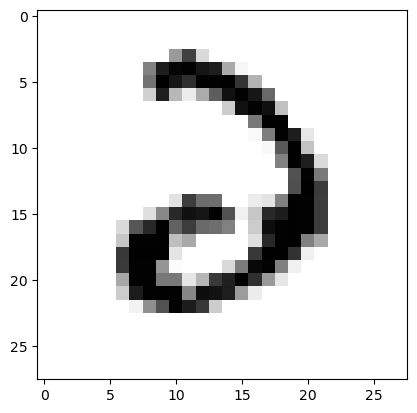

In [5]:
plt.imshow(images[0].numpy().squeeze(), cmap='gray_r');


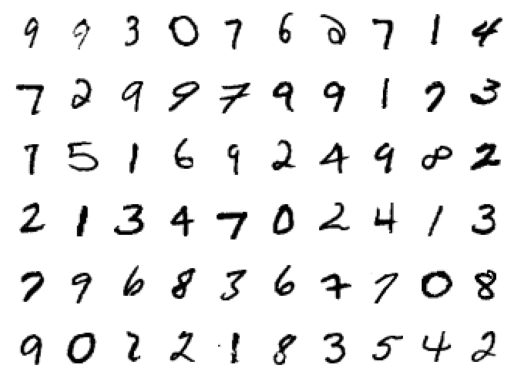

In [6]:
figure = plt.figure()
num_of_images = 60
for index in range(1, num_of_images + 1):
    plt.subplot(6, 10, index)
    plt.axis('off')
    plt.imshow(images[index].numpy().squeeze(), cmap='gray_r')
    

In [32]:
def train_model(model, trainloader, criterion, optimizer, epochs=15, device='cuda'):
    time0 = time.time()

    for e in range(epochs):
        running_loss = 0
        for images, labels in trainloader:
            images, labels = images.to(device), labels.to(device)
            # Flatten MNIST images into a 784 long vector
            images = images.view(images.shape[0], -1)

            # Training pass
            optimizer.zero_grad()

            output = model(images)
            loss = criterion(output, labels)

            # This is where the model learns by backpropagating
            loss.backward()

            # And optimizes its weights here
            optimizer.step()

            running_loss += loss.item()
        else:
            print("Epoch {} - Training loss: {}".format(e, running_loss/len(trainloader)))

    print("\nTraining Time (in minutes) =", (time.time()-time0)/60)

In [33]:
def extract_node_value_ranges(model, num_nodes_per_layer, trim, n_std):
    if trim == True:
        model.trim_node_values(n_std)
        node_dict = model.node_dict_trimmed
        sum_dict_original = sum(len(value) for layer in model.node_dict.values() for value in layer.values())
        sum_dict_trimmed = sum(len(value) for layer in model.node_dict_trimmed.values() for value in layer.values())
        print("Original = ", sum_dict_original, "node values")
        print("Trimmed = ", sum_dict_trimmed, "node values")
        print("Values removed =", sum_dict_original-sum_dict_trimmed)
        print("Percentage of nodes removed", 100*(sum_dict_original-sum_dict_trimmed)/sum_dict_original)
    else:
        node_dict = model.node_dict
    interval_dict = create_network_dict(num_nodes_per_layer=num_nodes_per_layer)
    for layer, subdict in node_dict.items():
        for node, values in subdict.items():
            min_values = min(values)
            max_values = max(values)
            interval_dict[layer][node] = [min_values, max_values]
    return interval_dict

In [34]:
def evaluate_model(model, valloader, trim = False, n_std = 2):
    device='cuda'
    hidden_sizes = model.hidden_sizes
    value_ranges = extract_node_value_ranges(model, num_nodes_per_layer=hidden_sizes, trim = trim, n_std = n_std)
    model.eval()
    model.testing = True
    model.reset_testing_dict()
    node_count = np.sum([len(subdict) for subdict in model.node_dict_testing.values()])

    correct_count, all_count = 0, 0
    percent_list = []
    prediction_list = []
    probab_list = []

    for images, labels in valloader:
        images, labels = images.to(device), labels.to(device)

        for index_to_test in range(images.shape[0]):
            img = images[index_to_test].view(1, -1)

            with torch.no_grad():
                logps = model(img)

                true_count = 0
                for layer, subdict in model.node_dict_testing.items():
                    for node, values in subdict.items():
                        min_value, max_value = value_ranges[layer][node]
                        if min_value <= values[all_count] <= max_value:
                            true_count += 1

                all_count += 1
                percent_true = true_count / node_count * 100
                percent_list.append(percent_true)
                true_count = 0

                ps = torch.exp(logps)
                probab = list(ps.detach().cpu().numpy()[0])
                pred_label = probab.index(max(probab))
                probab_list.append(max(probab))
                true_label = labels[index_to_test].detach().cpu().numpy()

                if true_label == pred_label:
                    prediction_list.append(True)
                    correct_count += 1
                else:
                    prediction_list.append(False)

    accuracy = correct_count / all_count if all_count > 0 else 0.0
    return accuracy, percent_list, prediction_list, probab_list



In [35]:
def evaluate_model_truth(model, valloader, trim = False, n_std = 2):
    device='cuda'
    hidden_sizes = model.hidden_sizes
    value_ranges = extract_node_value_ranges(model, num_nodes_per_layer=hidden_sizes, trim = trim, n_std = n_std)
    model.eval()
    model.testing = True
    model.reset_testing_dict()
    node_count = np.sum([len(subdict) for subdict in model.node_dict_testing.values()])

    correct_count, all_count = 0, 0
    percent_list = []
    prediction_list = []
    probab_list = []

    for images, labels in valloader:
        images, labels = images.to(device), labels.to(device)

        for index_to_test in range(images.shape[0]):
            img = images[index_to_test].view(1, -1)

            with torch.no_grad():
                logps = model(img)

                true_count = 0
                for layer, subdict in model.node_dict_testing.items():
                    for node, values in subdict.items():
                        min_value, max_value = value_ranges[layer][node]
                        if min_value <= values[all_count] <= max_value:
                            true_count += 1

                all_count += 1
                percent_true = true_count / node_count * 100
                percent_list.append(percent_true)
                true_count = 0

                ps = torch.exp(logps)
                probab = list(ps.detach().cpu().numpy()[0])
                pred_label = probab.index(max(probab))
                true_label = labels[index_to_test].detach().cpu().numpy()
                probab_list.append(probab[true_label])
                

                if true_label == pred_label:
                    prediction_list.append(True)
                    correct_count += 1
                else:
                    prediction_list.append(False)

    accuracy = correct_count / all_count if all_count > 0 else 0.0
    return accuracy, percent_list, prediction_list, probab_list

In [36]:
def plot_percentage_scatter(percentages, correct_predictions, num_points=None, ymin=0, ymax=102, title = None):
    
    
    data_points = [{'percentage_true': percent, 'correct_prediction': correct} for percent, correct in zip(percentages[:num_points], correct_predictions[:num_points])]

    percentages = [point['percentage_true'] for point in data_points]
    correct_predictions = [point['correct_prediction'] for point in data_points]

    # Plot points
    plt.figure(figsize=(12, 6))

    #progress_bar = tqdm(total=len(percentages), desc='Plotting')

    for i, (percent, correct) in enumerate(zip(percentages, correct_predictions)):
        marker = 'o' if correct else '^'
        color = 'green' if correct else 'red'
        plt.scatter(i + 1, percent, marker=marker, color=color, s=10, alpha=0.7)

        # Update the progress bar
        #progress_bar.update(1)
        #time.sleep(0.01)

    #progress_bar.close()

    plt.xlabel('Predictions')
    plt.ylabel('Percentage of True Nodes')
    if title == None:
        title = 'Scatter Plot of Percentage of True Nodes for Different Scenarios'
    plt.title(title)
    plt.ylim(ymin, ymax)

    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10),
                      plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='red', markersize=10)]
    legend_labels = ['Correct Prediction', 'Incorrect Prediction']

    # Show the legend with custom handles and labels
    plt.legend(handles=legend_handles, labels=legend_labels)

    # Show the plot
    plt.show()

In [37]:
# def plot_percentage_scatter_probab(percentages, correct_predictions, probabs, num_points=None, ymin=0, ymax=102, title = None):

#     # Plot points
#     plt.figure(figsize=(12, 6))

#     #progress_bar = tqdm(total=len(percentages), desc='Plotting')

#     for i, (percent, correct) in enumerate(zip(percentages, correct_predictions)):
#         marker = 'o' if correct else '^'
#         color = 'green' if correct else 'red'
#         plt.scatter(i + 1, percent, marker=marker, color=color, s=10, alpha=0.7)

#         # Update the progress bar
#         #progress_bar.update(1)
#         #time.sleep(0.01)

#     #progress_bar.close()

#     plt.xlabel('Predictions')
#     plt.ylabel('Percentage of True Nodes')
#     if title == None:
#         title = 'Scatter Plot of Percentage of True Nodes for Different Scenarios'
#     plt.title(title)
#     plt.ylim(ymin, ymax)

#     legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10),
#                       plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='red', markersize=10)]
#     legend_labels = ['Correct Prediction', 'Incorrect Prediction']

#     # Show the legend with custom handles and labels
#     plt.legend(handles=legend_handles, labels=legend_labels)

#     # Show the plot
#     plt.show()

In [38]:

from matplotlib.colors import LinearSegmentedColormap

def plot_predictions_scatter_probab_aux(ax, probabs, percentages, color_map, title, ymin=0, ymax=102):
    scatter = ax.scatter(range(len(probabs)), percentages, c=probabs, cmap=color_map, vmin=0, vmax=1)
    plt.colorbar(scatter, ax=ax, label='Probability')  # Add colorbar
    ax.set_xlabel('Predictions')
    ax.set_ylabel('Percentage of True Nodes')
    ax.set_title(title)
    ax.set_ylim(ymin, ymax)

def plot_percentage_scatter_probab(percentages, correct_predictions, probabs, num_points=None, title=None, ymin=0, ymax=102, k = 1):
    data_points = [{'percentage_true': percent, 'correct_prediction': correct, "probabs": probability} 
                   for percent, correct, probability in zip(percentages[:num_points], correct_predictions[:num_points], probabs[:num_points])]
    
    # Separate correct and incorrect predictions
    correct_data = [point for point in data_points if point['correct_prediction']]
    incorrect_data = [point for point in data_points if not point['correct_prediction']]
    
    # Define custom colormaps
    blue_yellow_cmap = LinearSegmentedColormap.from_list("blue_yellow_cmap", [(0, 'yellow'), (1, 'blue')])
    red_yellow_cmap = LinearSegmentedColormap.from_list("red_yellow_cmap", [(0, 'yellow'), (1, 'red')])
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot correct predictions
    plot_predictions_scatter_probab_aux(axs[0], [point['probabs'] for point in correct_data], 
                             [point['percentage_true'] for point in correct_data], 
                             blue_yellow_cmap, 
                             f"Correct Predictions (k={k})", ymin, ymax)
    
    # Plot incorrect predictions
    plot_predictions_scatter_probab_aux(axs[1], [point['probabs'] for point in incorrect_data], 
                             [point['percentage_true'] for point in incorrect_data], 
                             red_yellow_cmap, 
                             f"Incorrect Predictions (k={k})", ymin, ymax)
    
    plt.tight_layout()
    plt.show()



In [39]:

from matplotlib.colors import LinearSegmentedColormap

def plot_predictions_scatter_probab_aux_truth(probabs, percentages, color_map, title, ymin=0, ymax=102):
    plt.figure(figsize=(8, 6))
    plt.scatter(range(len(probabs)), percentages, c=probabs, cmap=color_map, vmin=0, vmax=1)
    plt.colorbar(label='Probability')
    plt.xlabel('Predictions')
    plt.ylabel('Percentage of True Nodes')
    plt.title(title)
    plt.ylim(ymin, ymax)
    plt.show()

def plot_percentage_scatter_probab_truth(percentages, correct_predictions, probabs, num_points=None, title=None, ymin=0, ymax=102, k=1):
    data_points = [{'percentage_true': percent, 'correct_prediction': correct, "probabs": probability} 
                   for percent, correct, probability in zip(percentages[:num_points], correct_predictions[:num_points], probabs[:num_points])]
    
    # Separate correct and incorrect predictions
    correct_data = [point for point in data_points if point['correct_prediction']]
    incorrect_data = [point for point in data_points if not point['correct_prediction']]
    
    # Define custom colormaps
    blue_yellow_cmap = LinearSegmentedColormap.from_list("blue_yellow_cmap", [(0, 'yellow'), (1, 'blue')])
    red_yellow_cmap = LinearSegmentedColormap.from_list("red_yellow_cmap", [(0, 'yellow'), (1, 'red')])
    
    # Plot correct predictions
    plot_predictions_scatter_probab_aux_truth([point['probabs'] for point in correct_data], 
                             [point['percentage_true'] for point in correct_data], 
                             blue_yellow_cmap, 
                             f"Correct Predictions (k={k})", ymin, ymax)
    
    # Plot incorrect predictions
    plot_predictions_scatter_probab_aux_truth([point['probabs'] for point in incorrect_data], 
                             [point['percentage_true'] for point in incorrect_data], 
                             plt.cm.coolwarm, 
                             f"Incorrect Predictions (k={k})", ymin, ymax)
    
    p, pvalue_p, s, pvalue_s = find_corr([point['percentage_true'] for point in incorrect_data], [point['probabs'] for point in incorrect_data])
    correlation_list.append((p, pvalue_p, s, pvalue_s))
    for i, tup in enumerate(correlation_list):
        print(f"For std = {k}, pearson correlation = {p} with pvalue {pvalue_p}")
        print(f"For std = {k}, spearman correlation = {s} with pvalue value_s")
    
    

# # Example usage
# percentages = np.random.randint(50, 100, 100)
# correct_predictions = np.random.choice([True, False], 100)
# probabs = np.random.rand(100)

# plot_percentage_scatter_probab(percentages, correct_predictions, probabs, title="Custom Scatter Plot", ymin=40, ymax=110)


In [40]:
def find_corr(array_v, array_bool):
  numeric_boolean_values = array_bool
  pearson_corr, pearson_p_value = pearsonr(array_v, numeric_boolean_values)
  spearman_corr, spearman_p_value = spearmanr(array_v, numeric_boolean_values)
  return pearson_corr, pearson_p_value, spearman_corr, spearman_p_value

# Sigmoid Model

In [16]:
input_size = 784
hidden_sizes = [128, 64]
output_size = 10

def create_network_dict(num_nodes_per_layer):
    network_dict = {}
    for layer in range(1, len(num_nodes_per_layer) + 1):
        layer_name = f"Layer{layer}"
        network_dict[layer_name] = {f"node{i}": [] for i in range(num_nodes_per_layer[layer - 1])}
    return network_dict

class MyModel_sigmoid(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size):
        super(MyModel_sigmoid, self).__init__()

        self.layer1 = nn.Linear(input_size, hidden_sizes[0])
        self.sigmoid1 = nn.Sigmoid()
        self.layer2 = nn.Linear(hidden_sizes[0], hidden_sizes[1])
        self.sigmoid2 = nn.Sigmoid()
        self.layer3 = nn.Linear(hidden_sizes[1], output_size)
        self.log_softmax = nn.LogSoftmax(dim=1)
        self.node_dict = create_network_dict(num_nodes_per_layer=hidden_sizes)
        self.node_dict_testing = create_network_dict(num_nodes_per_layer=hidden_sizes)
        self.testing = False
        self.hidden_sizes = hidden_sizes
        self.node_dict_trimmed = create_network_dict(num_nodes_per_layer=hidden_sizes)
        self.record = True

    def record_node_values(self, x, layer, hidden_sizes, record):
        if record:
            if self.testing:
                for j in range(len(x[0])):
                    self.node_dict_testing[f"Layer{layer}"][f"node{j}"].extend(x[:, j].detach().cpu().numpy())
            else:
                for j in range(len(x[0])):
                    self.node_dict[f"Layer{layer}"][f"node{j}"].extend(x[:, j].detach().cpu().numpy())

    def forward(self, x):
        layer = 1
        x = self.sigmoid1(self.layer1(x))
        self.record_node_values(x, layer, hidden_sizes, self.record)
        layer+=1
        x = self.sigmoid2(self.layer2(x))
        self.record_node_values(x, layer, hidden_sizes, self.record)
        x = self.log_softmax(self.layer3(x))
        return x

    def reset_testing_dict(self):
        self.node_dict_testing = create_network_dict(num_nodes_per_layer=hidden_sizes)
        
    def trim_node_values(self, n_std = 2):
        for layer, subdict in self.node_dict.items():
            for node, values in subdict.items():
                values_array = np.array(values)
                mean = np.mean(values_array)
                std = np.std(values_array)
                filtered_values_array = values_array[(mean - n_std * std <= values_array) & (values_array <= mean + n_std * std)].tolist()
                self.node_dict_trimmed[layer][node] = filtered_values_array
                       
    

model_sigmoid = MyModel_sigmoid(input_size, hidden_sizes, output_size)
device = torch.device('cuda')  # use cuda or cpu
model_sigmoid.to(device)
print(model_sigmoid)
optimizer = optim.SGD(model_sigmoid.parameters(), lr=0.003, momentum=0.9)
criterion = nn.NLLLoss()
train_model(model_sigmoid, trainloader, criterion, optimizer, epochs=15)

MyModel_sigmoid(
  (layer1): Linear(in_features=784, out_features=128, bias=True)
  (sigmoid1): Sigmoid()
  (layer2): Linear(in_features=128, out_features=64, bias=True)
  (sigmoid2): Sigmoid()
  (layer3): Linear(in_features=64, out_features=10, bias=True)
  (log_softmax): LogSoftmax(dim=1)
)
Epoch 0 - Training loss: 2.2513154282498715
Epoch 1 - Training loss: 1.5843154308892518
Epoch 2 - Training loss: 0.850078988431105
Epoch 3 - Training loss: 0.5893410759439854
Epoch 4 - Training loss: 0.47046696944340965
Epoch 5 - Training loss: 0.4066092187820721
Epoch 6 - Training loss: 0.36717813157800167
Epoch 7 - Training loss: 0.33958478902639355
Epoch 8 - Training loss: 0.3176825046777598
Epoch 9 - Training loss: 0.29948424627341186
Epoch 10 - Training loss: 0.2833333732302128
Epoch 11 - Training loss: 0.2685320579977051
Epoch 12 - Training loss: 0.25457863650246976
Epoch 13 - Training loss: 0.242408777184006
Epoch 14 - Training loss: 0.2307317419958585

Training Time (in minutes) = 4.033850

### Probabilities

In [17]:
accuracy_sigmoid, percent_list_sigmoid, prediction_list_sigmoid, probab_list_sigmoid = evaluate_model(model_sigmoid, valloader, trim = False, n_std = 2)
print(f"Model Accuracy = {accuracy_sigmoid * 100}%")

Model Accuracy = 93.51%


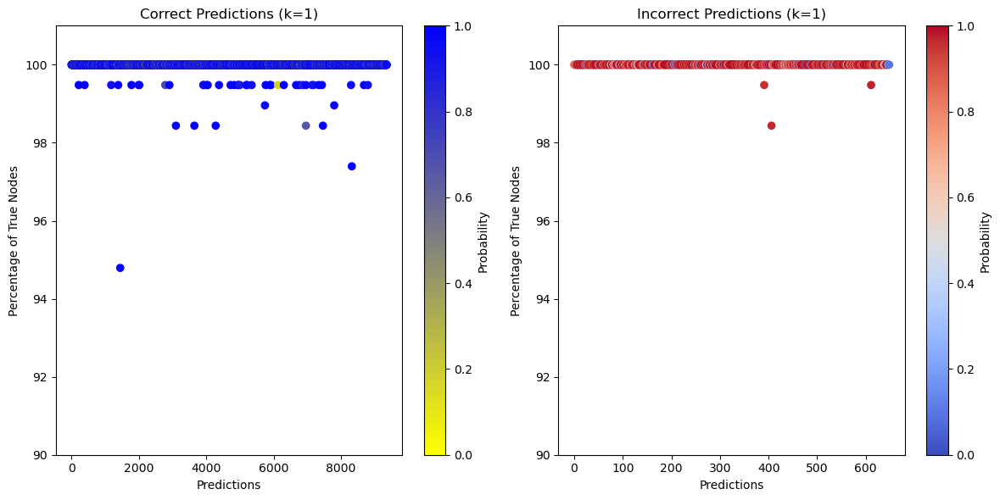

In [27]:
plot_percentage_scatter_probab(percent_list_sigmoid, prediction_list_sigmoid, probab_list_sigmoid, ymin=90, ymax=101,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model")

In [28]:
pearsonr(percent_list_sigmoid_trimmed, probab_list_sigmoid)

PearsonRResult(statistic=-0.4292101402172548, pvalue=0.0)

### Trimming using mean and std

In [29]:
# k_list = [0.5, 1, 1.5, 2, 2.5, 3]
# # k_list = [1.5]
# correlation_list=[]
# for k in k_list:
#     accuracy_sigmoid_trimmed, percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed, probab_list_sigmoid = evaluate_model(model_sigmoid, 
#                                                                                                              valloader, trim = True, 
#                                                                                                              n_std = k)
#     plot_percentage_scatter_probab(percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed,probab_list_sigmoid, num_points=None, ymin=0, ymax=102,
#                        title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with trimmed node values(std={k})", k=k)

Original =  172800000 node values
Trimmed =  47499969 node values
Values removed = 125300031
Percentage of nodes removed 72.51159201388889



KeyboardInterrupt



Original =  172800000 node values
Trimmed =  47499969 node values
Values removed = 125300031
Percentage of nodes removed 72.51159201388889


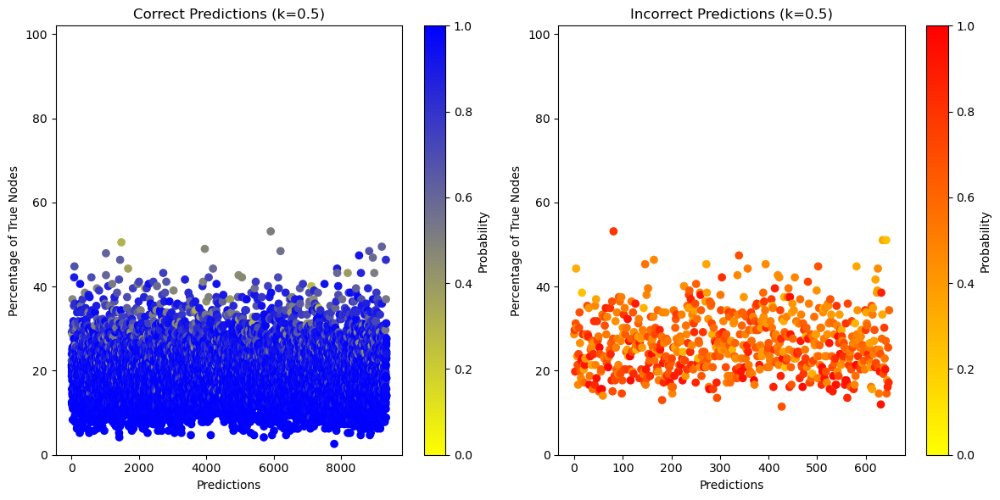

Original =  172800000 node values
Trimmed =  104374775 node values
Values removed = 68425225
Percentage of nodes removed 39.59793113425926


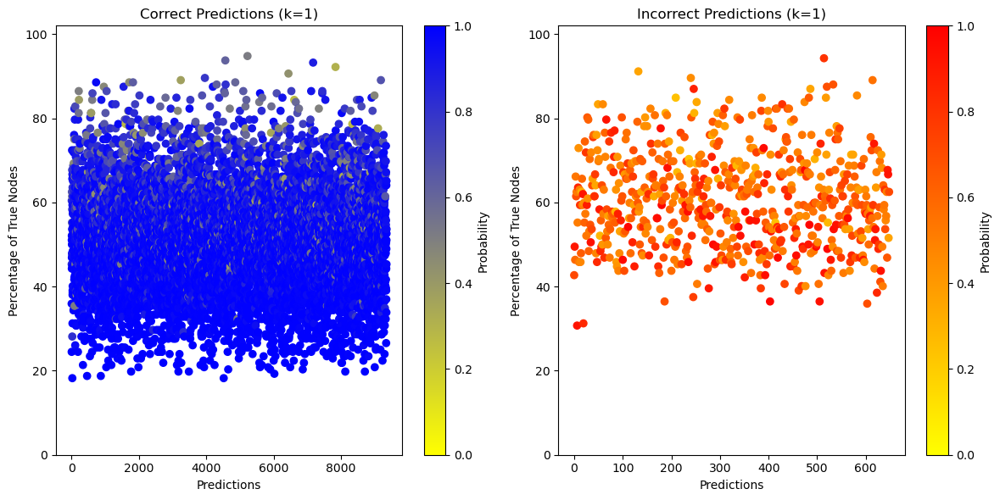

Original =  172800000 node values
Trimmed =  153752408 node values
Values removed = 19047592
Percentage of nodes removed 11.022912037037036


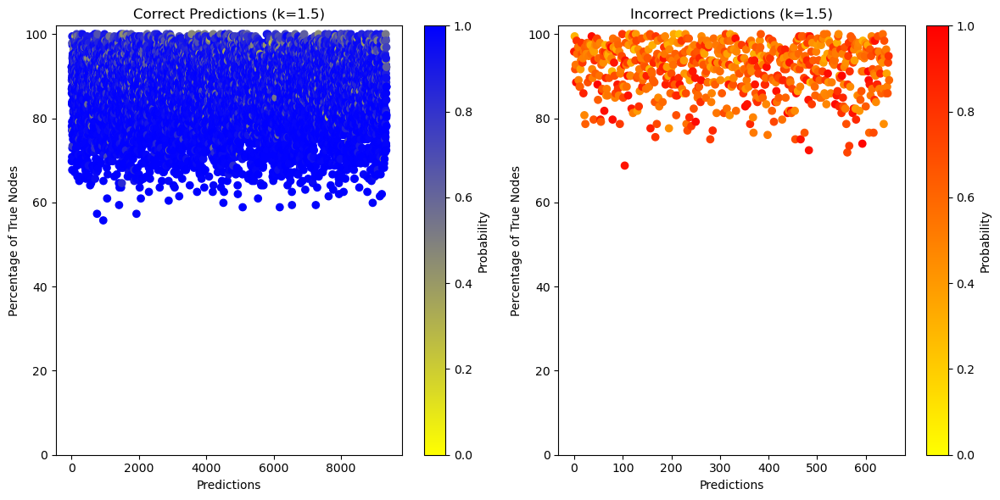

Original =  172800000 node values
Trimmed =  170110463 node values
Values removed = 2689537
Percentage of nodes removed 1.5564450231481481


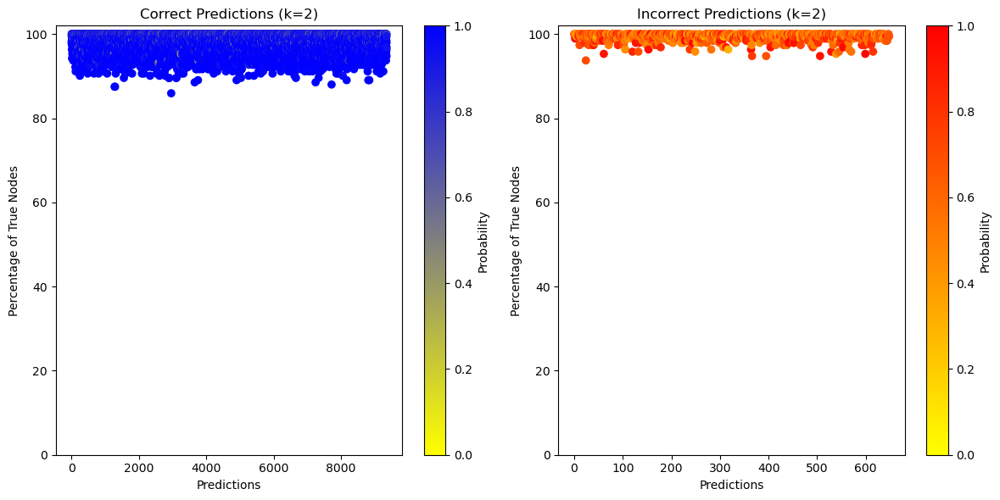

Original =  172800000 node values
Trimmed =  172594841 node values
Values removed = 205159
Percentage of nodes removed 0.11872627314814815


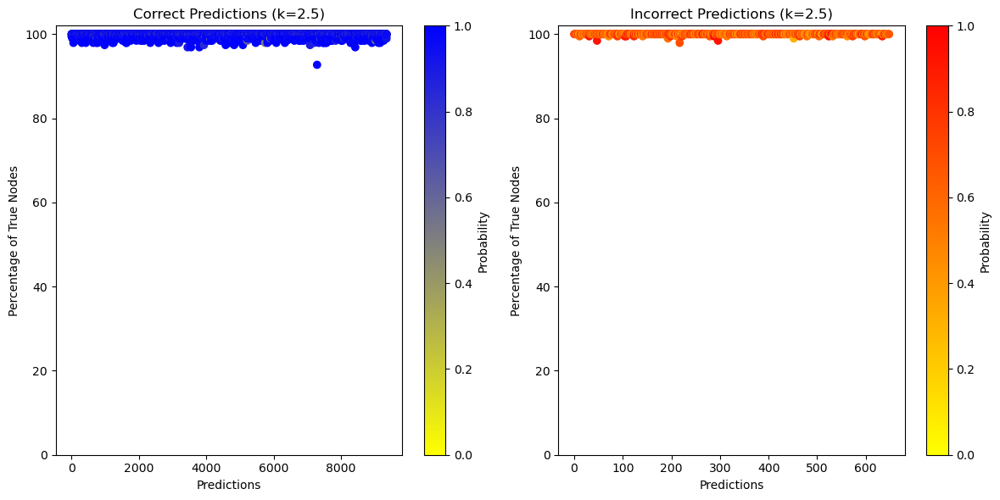

Original =  172800000 node values
Trimmed =  172797630 node values
Values removed = 2370
Percentage of nodes removed 0.0013715277777777777


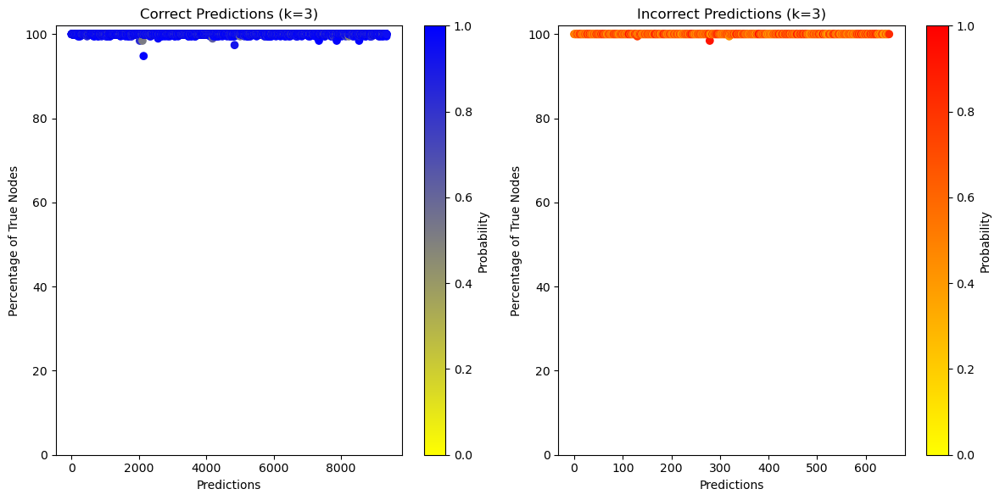

For std = 0.5, pearson correlation = -0.4910932791118522 with pvalue 0.0
For std = 0.5, spearman correlation = -0.5900897454815788 with pvalue 0.0
For std = 1, pearson correlation = -0.42103674097668947 with pvalue 0.0
For std = 1, spearman correlation = -0.548335924149274 with pvalue 0.0
For std = 1.5, pearson correlation = -0.3460518839773455 with pvalue 2.7757062879779644e-279
For std = 1.5, spearman correlation = -0.496823089764136 with pvalue 0.0
For std = 2, pearson correlation = -0.3097163378093464 with pvalue 3.0101856001452296e-221
For std = 2, spearman correlation = -0.5368253141426731 with pvalue 0.0
For std = 2.5, pearson correlation = -0.17907689693915374 with pvalue 7.670555910201293e-73
For std = 2.5, spearman correlation = -0.34902392041156305 with pvalue 2.1808474389286698e-284
For std = 3, pearson correlation = -0.0191940088563903 with pvalue 0.05494160435734109
For std = 3, spearman correlation = -0.04403926442913389 with pvalue 1.0553371360478771e-05


In [41]:
k_list = [0.5, 1, 1.5, 2, 2.5, 3]
# k_list = [1.5]
correlation_list=[]
for k in k_list:
    accuracy_sigmoid_trimmed, percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed, probab_list_sigmoid = evaluate_model(model_sigmoid, 
                                                                                                             valloader, trim = True, 
                                                                                                             n_std = k)
    plot_percentage_scatter_probab(percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed,probab_list_sigmoid, num_points=None, ymin=0, ymax=102,
                       title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with trimmed node values(std={k})", k=k)
    p, pvalue_p, s, pvalue_s = find_corr(percent_list_sigmoid_trimmed, probab_list_sigmoid)
    correlation_list.append((p, pvalue_p, s, pvalue_s))
for i, tup in enumerate(correlation_list):
    print(f"For std = {k_list[i]}, pearson correlation = {tup[0]} with pvalue {tup[1]}")
    print(f"For std = {k_list[i]}, spearman correlation = {tup[2]} with pvalue {tup[3]}")

Original =  172800000 node values
Trimmed =  47499969 node values
Values removed = 125300031
Percentage of nodes removed 72.51159201388889


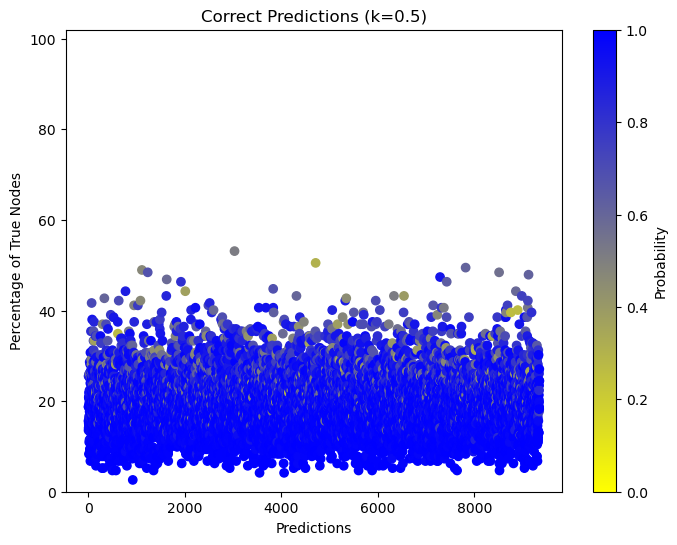

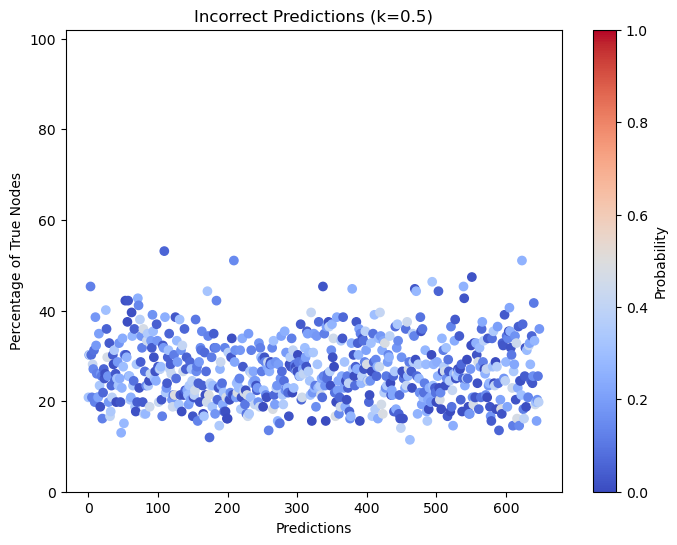

For std = 0.5, pearson correlation = -0.05303802927240181 with pvalue 0.1771717939331
For std = 0.5, spearman correlation = -0.021929682138482454 with pvalue value_s
Original =  172800000 node values
Trimmed =  104374775 node values
Values removed = 68425225
Percentage of nodes removed 39.59793113425926


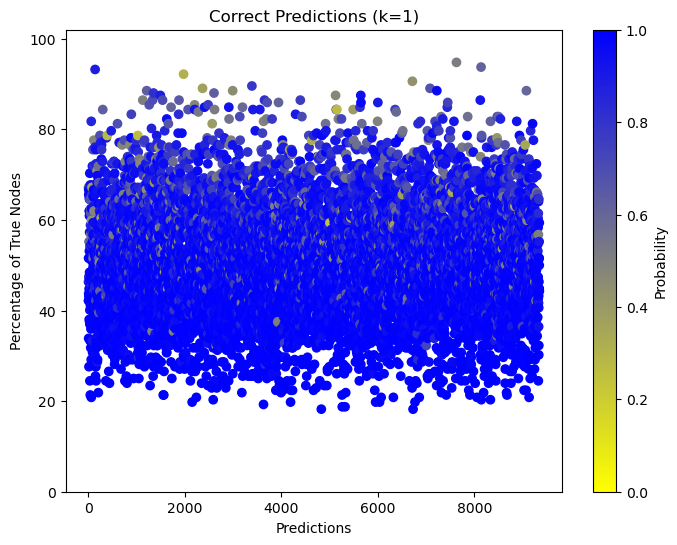

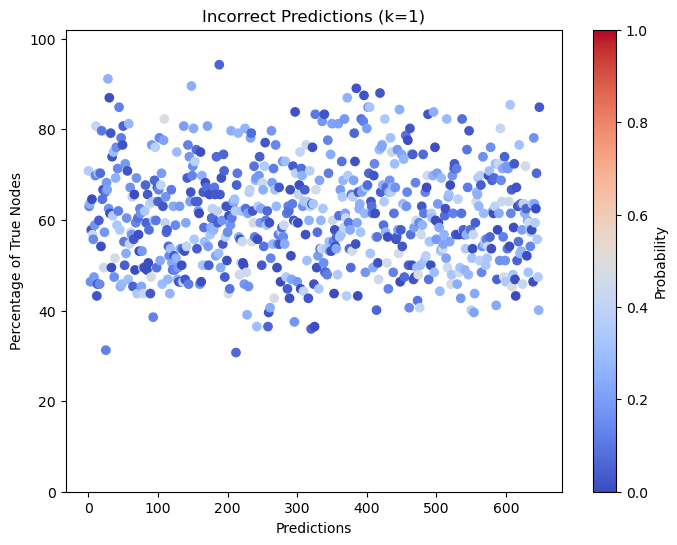

For std = 1, pearson correlation = -0.045146615551075325 with pvalue 0.25076216719347394
For std = 1, spearman correlation = -0.01894247096533884 with pvalue value_s
For std = 1, pearson correlation = -0.045146615551075325 with pvalue 0.25076216719347394
For std = 1, spearman correlation = -0.01894247096533884 with pvalue value_s
For std = 1, pearson correlation = -0.045146615551075325 with pvalue 0.25076216719347394
For std = 1, spearman correlation = -0.01894247096533884 with pvalue value_s
Original =  172800000 node values
Trimmed =  153752408 node values
Values removed = 19047592
Percentage of nodes removed 11.022912037037036


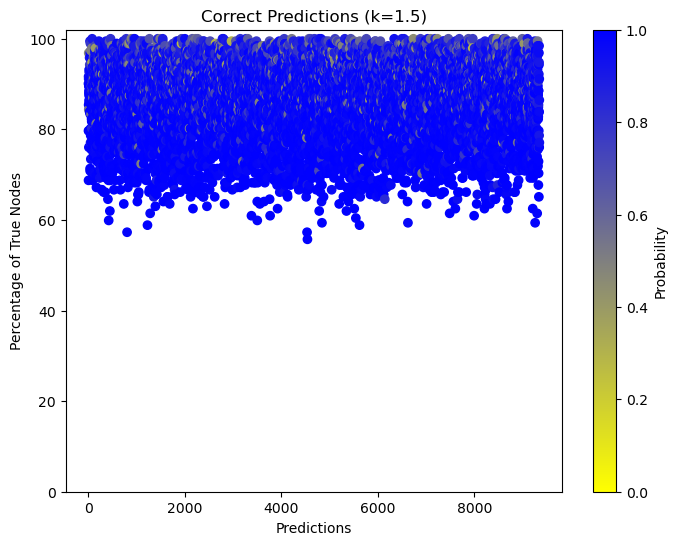

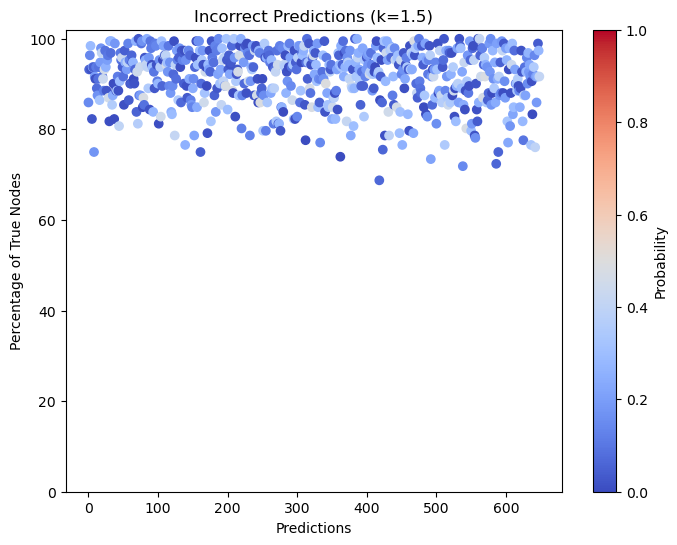

For std = 1.5, pearson correlation = -0.033782728598018785 with pvalue 0.39022060993573143
For std = 1.5, spearman correlation = -0.03169096375694221 with pvalue value_s
For std = 1.5, pearson correlation = -0.033782728598018785 with pvalue 0.39022060993573143
For std = 1.5, spearman correlation = -0.03169096375694221 with pvalue value_s
For std = 1.5, pearson correlation = -0.033782728598018785 with pvalue 0.39022060993573143
For std = 1.5, spearman correlation = -0.03169096375694221 with pvalue value_s
For std = 1.5, pearson correlation = -0.033782728598018785 with pvalue 0.39022060993573143
For std = 1.5, spearman correlation = -0.03169096375694221 with pvalue value_s
For std = 1.5, pearson correlation = -0.033782728598018785 with pvalue 0.39022060993573143
For std = 1.5, spearman correlation = -0.03169096375694221 with pvalue value_s
Original =  172800000 node values
Trimmed =  170110463 node values
Values removed = 2689537
Percentage of nodes removed 1.5564450231481481


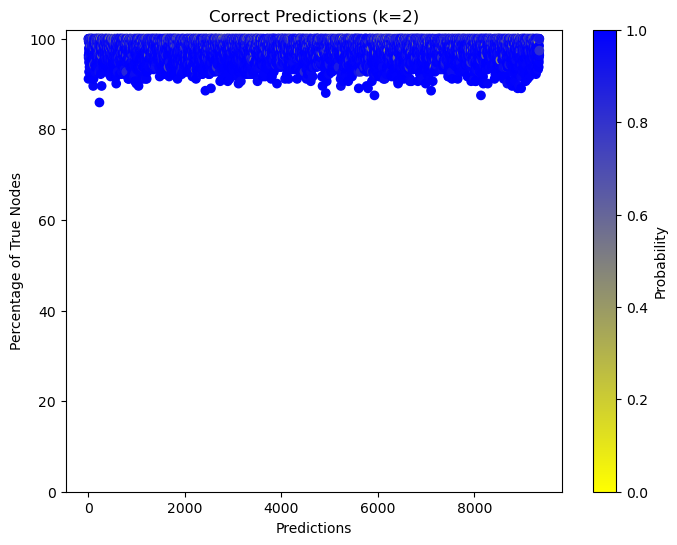

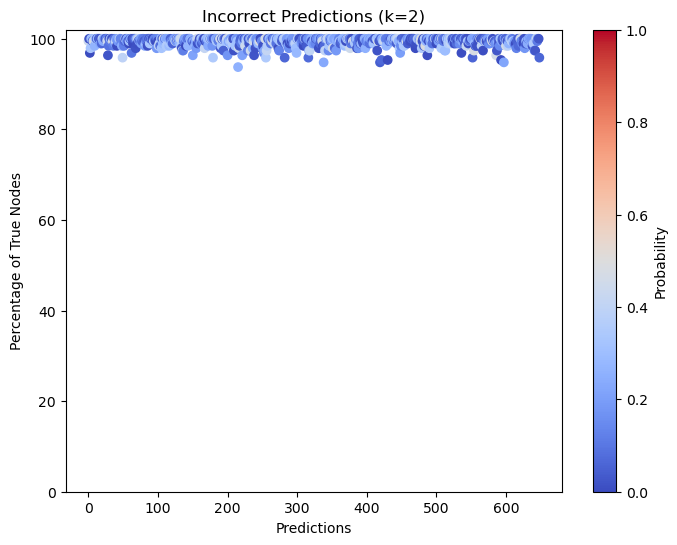

For std = 2, pearson correlation = 0.008343246228859333 with pvalue 0.8319961433762225
For std = 2, spearman correlation = 0.0010309376152151585 with pvalue value_s
For std = 2, pearson correlation = 0.008343246228859333 with pvalue 0.8319961433762225
For std = 2, spearman correlation = 0.0010309376152151585 with pvalue value_s
For std = 2, pearson correlation = 0.008343246228859333 with pvalue 0.8319961433762225
For std = 2, spearman correlation = 0.0010309376152151585 with pvalue value_s
For std = 2, pearson correlation = 0.008343246228859333 with pvalue 0.8319961433762225
For std = 2, spearman correlation = 0.0010309376152151585 with pvalue value_s
For std = 2, pearson correlation = 0.008343246228859333 with pvalue 0.8319961433762225
For std = 2, spearman correlation = 0.0010309376152151585 with pvalue value_s
For std = 2, pearson correlation = 0.008343246228859333 with pvalue 0.8319961433762225
For std = 2, spearman correlation = 0.0010309376152151585 with pvalue value_s
For std = 

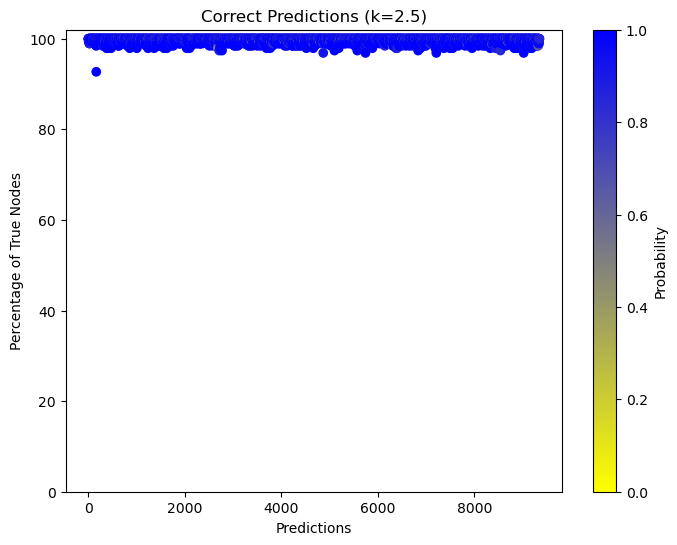

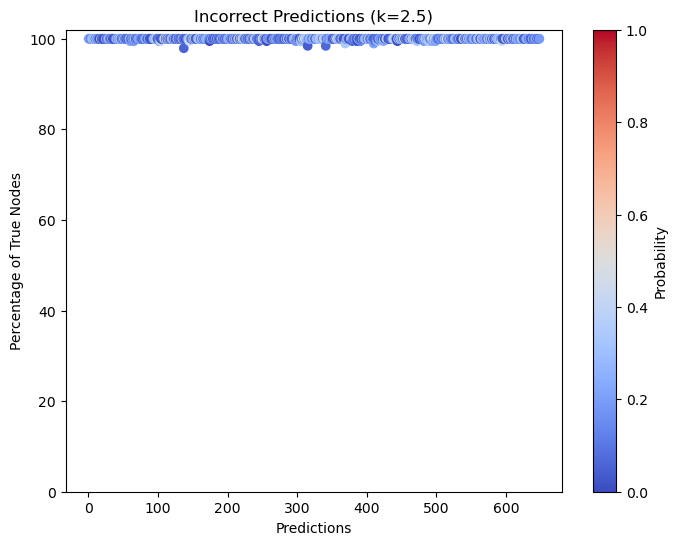

For std = 2.5, pearson correlation = 0.027547851858492733 with pvalue 0.4835684212278928
For std = 2.5, spearman correlation = 0.0022651591400655265 with pvalue value_s
For std = 2.5, pearson correlation = 0.027547851858492733 with pvalue 0.4835684212278928
For std = 2.5, spearman correlation = 0.0022651591400655265 with pvalue value_s
For std = 2.5, pearson correlation = 0.027547851858492733 with pvalue 0.4835684212278928
For std = 2.5, spearman correlation = 0.0022651591400655265 with pvalue value_s
For std = 2.5, pearson correlation = 0.027547851858492733 with pvalue 0.4835684212278928
For std = 2.5, spearman correlation = 0.0022651591400655265 with pvalue value_s
For std = 2.5, pearson correlation = 0.027547851858492733 with pvalue 0.4835684212278928
For std = 2.5, spearman correlation = 0.0022651591400655265 with pvalue value_s
For std = 2.5, pearson correlation = 0.027547851858492733 with pvalue 0.4835684212278928
For std = 2.5, spearman correlation = 0.0022651591400655265 with p

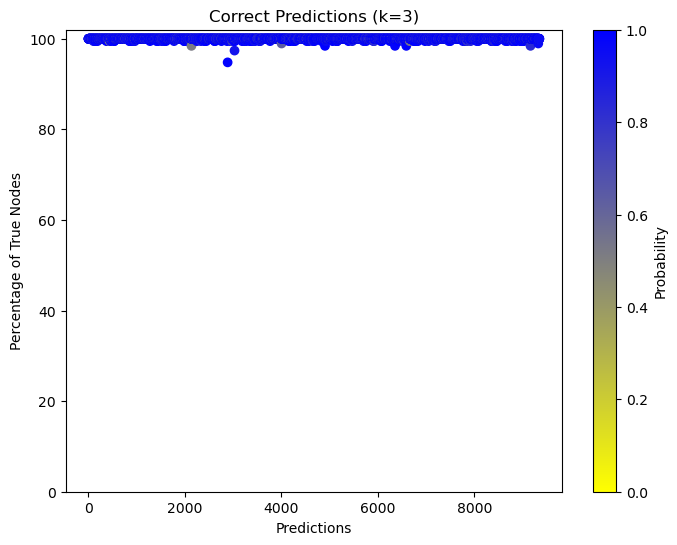

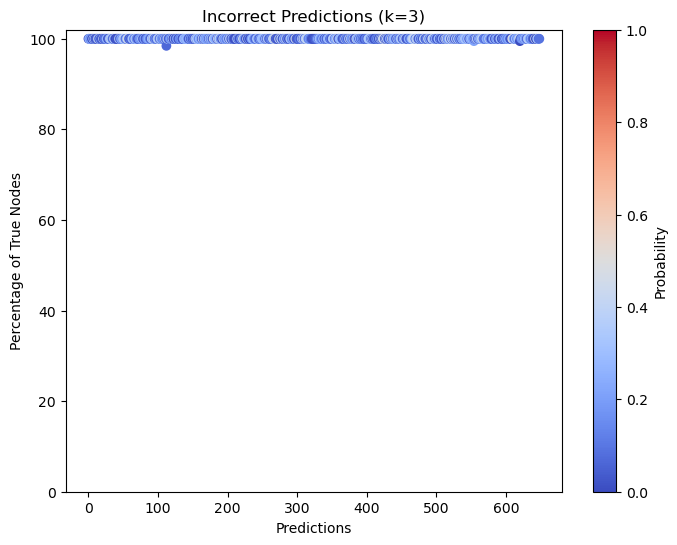

For std = 3, pearson correlation = 0.044470158949724066 with pvalue 0.2579396471556492
For std = 3, spearman correlation = 0.05056363325357154 with pvalue value_s
For std = 3, pearson correlation = 0.044470158949724066 with pvalue 0.2579396471556492
For std = 3, spearman correlation = 0.05056363325357154 with pvalue value_s
For std = 3, pearson correlation = 0.044470158949724066 with pvalue 0.2579396471556492
For std = 3, spearman correlation = 0.05056363325357154 with pvalue value_s
For std = 3, pearson correlation = 0.044470158949724066 with pvalue 0.2579396471556492
For std = 3, spearman correlation = 0.05056363325357154 with pvalue value_s
For std = 3, pearson correlation = 0.044470158949724066 with pvalue 0.2579396471556492
For std = 3, spearman correlation = 0.05056363325357154 with pvalue value_s
For std = 3, pearson correlation = 0.044470158949724066 with pvalue 0.2579396471556492
For std = 3, spearman correlation = 0.05056363325357154 with pvalue value_s
For std = 3, pearson c

IndexError: list index out of range

In [42]:
k_list = [0.5, 1, 1.5, 2, 2.5, 3]
# k_list = [1.5]
correlation_list=[]
for k in k_list:
    accuracy_sigmoid_trimmed, percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed, probab_list_sigmoid = evaluate_model_truth(model_sigmoid, 
                                                                                                             valloader, trim = True, 
                                                                                                             n_std = k)
    plot_percentage_scatter_probab_truth(percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed,probab_list_sigmoid, num_points=None, ymin=0, ymax=102,
                       title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with trimmed node values(std={k})", k=k)
    p, pvalue_p, s, pvalue_s = find_corr(percent_list_sigmoid_trimmed, probab_list_sigmoid)
    correlation_list.append((p, pvalue_p, s, pvalue_s))
for i, tup in enumerate(correlation_list):
    print(f"For std = {k_list[i]}, pearson correlation = {tup[0]} with pvalue {tup[1]}")
    print(f"For std = {k_list[i]}, spearman correlation = {tup[2]} with pvalue {tup[3]}")

## Gaussian Mixture Models

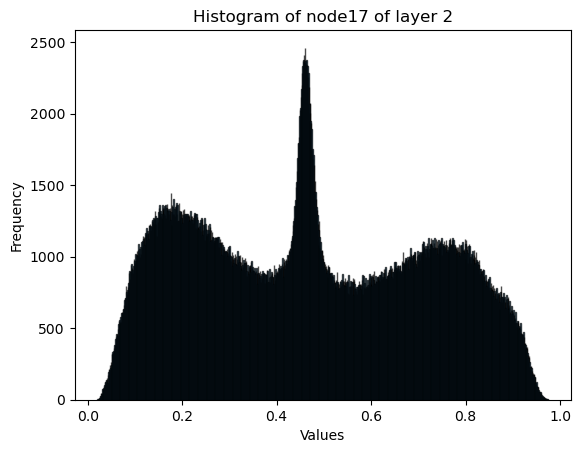

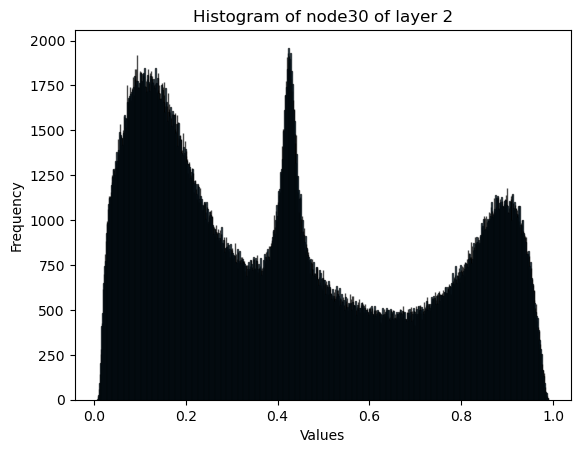

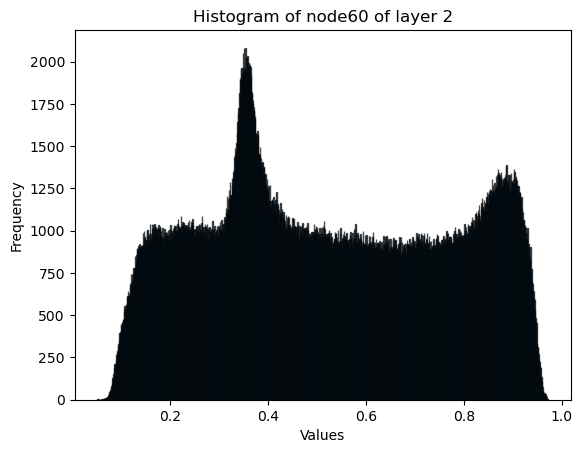

In [43]:
k_list = [17, 30, 60]

for k in k_list:

        # Determine the range of data
        data_min = min(model_sigmoid.node_dict["Layer2"][f"node{k}"])
        data_max = max(model_sigmoid.node_dict["Layer2"][f"node{k}"])
        step_size = 0.001

        # Calculate the number of bins needed
        num_bins = int((data_max - data_min) / step_size) + 1

        # Generate bins with adjusted range and step size
        bins = np.linspace(data_min, data_max, num_bins)

        # Plot the histogram
        plt.hist(model_sigmoid.node_dict["Layer2"][f"node{k}"], bins=bins, edgecolor='black', alpha=0.7)

        # Set labels and title for the plot
        plt.xlabel('Values')
        plt.ylabel('Frequency')
        plt.title(f'Histogram of node{k} of layer 2')

        # Show the plot
        plt.show()


Here, we compute the AIC and the BIC scores:
We define $k$ as the number of independent variables to build model, $L$L the maximum likelihood estimate of model, and $n$ the sample size.

- AIC $=2k - 2\log(L)$
- BIC $= \log(n)k - 2\log(L)$

In [44]:
from sklearn.mixture import GaussianMixture

# Assuming you have already defined model_sigmoid and imported necessary libraries

# Define the range of components
k_arr = np.arange(6) + 1

# Initialize an array to store GMM models for each node and each value of k
models_by_node = []

# Iterate over nodes
for i in [17, 30, 60]:
    X = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"]).reshape(-1, 1)
    
    # Initialize an array to store GMM models for this node
    models_for_node = []
    
    # Fit GMMs for different values of k
    for k in k_arr:
        gmm = GaussianMixture(n_components=k).fit(X)
        models_for_node.append(gmm)
    
    # Append the models for this node to the overall list
    models_by_node.append(models_for_node)

# # Plotting
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for models_for_node, ax_row in zip(models_by_node, axes):
#     for gmm, ax in zip(models_for_node, ax_row):
#         plot_mixture(gmm, X, show_legend=False, ax=ax)
#         ax.set_title(f'k={gmm.n_components}')
# plt.tight_layout()

# Compute AIC and BIC for each model
AIC_by_node = []
BIC_by_node = []
for models_for_node in models_by_node:
    AIC_for_node = [m.aic(X) for m in models_for_node]
    BIC_for_node = [m.bic(X) for m in models_for_node]
    AIC_by_node.append(AIC_for_node)
    BIC_by_node.append(BIC_for_node)
    
# Find the best models based on AIC
best_models_by_node = [models[np.argmin(AIC_node)] for models, AIC_node in zip(models_by_node, AIC_by_node)]

# # Plot AIC and BIC
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for AIC_node, BIC_node, ax_row in zip(AIC_by_node, BIC_by_node, axes):
#     ax_row[0].plot(k_arr, AIC_node, label='AIC')
#     ax_row[1].plot(k_arr, BIC_node, label='BIC')
#     for ax in ax_row:
#         ax.set_xlabel('Number of Components ($k$)')
#         ax.legend()
# plt.tight_layout()



# # Plot the best models
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for best_model, ax_row in zip(best_models_by_node, axes):
#     plot_mixture(best_model, X, ax=ax_row[0])
#     ax_row[0].set_title(f'Best Model (k={best_model.n_components})')
# plt.tight_layout()


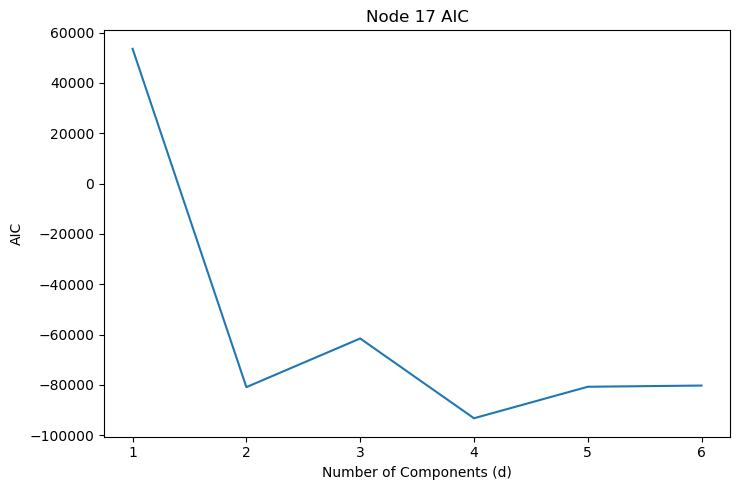

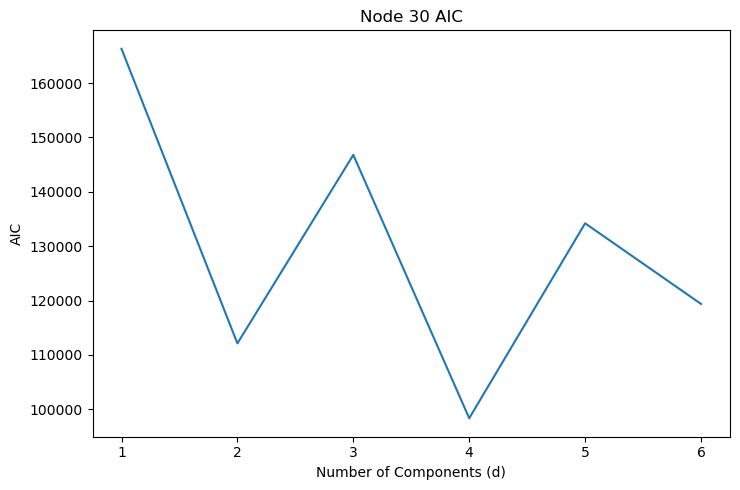

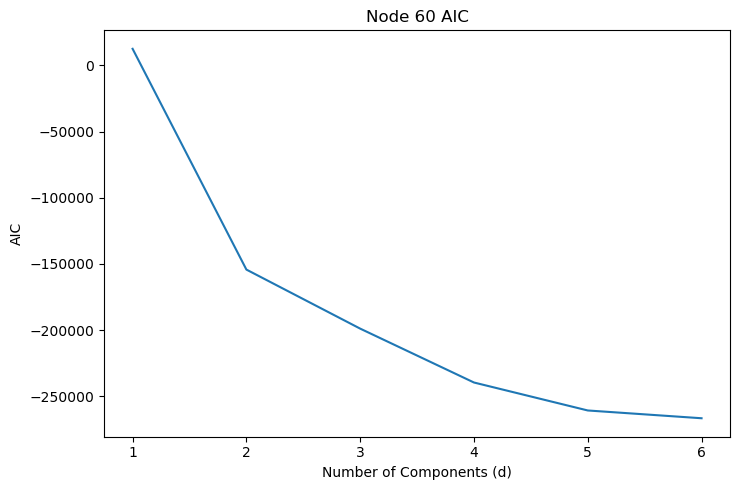

In [49]:
for i, node in enumerate([17, 30, 60]):
    plt.figure(figsize=(7.5, 5))  # Set the figure size
    plt.plot(k_arr, AIC_by_node[i])  # Plot BIC values for the current node
    plt.title(f'Node {node} AIC')  # Set the title
    plt.xlabel('Number of Components (d)')  # Set x-axis label
    plt.ylabel('AIC')  # Set y-axis label
    plt.tight_layout()  # Adjust layout
    plt.show()  # Show the plot

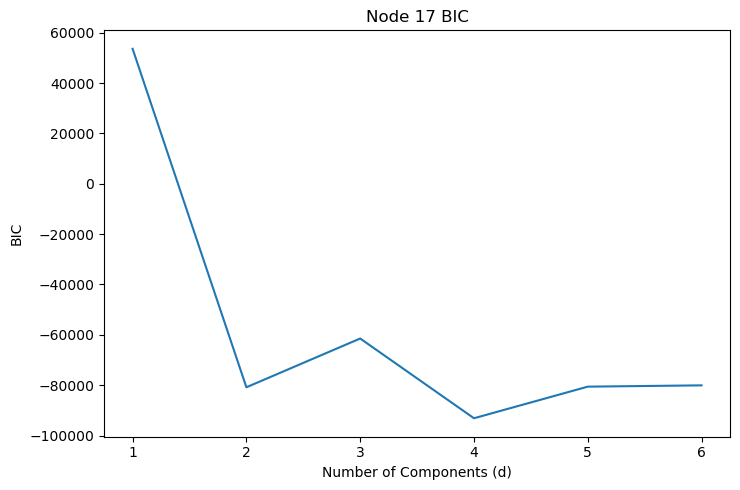

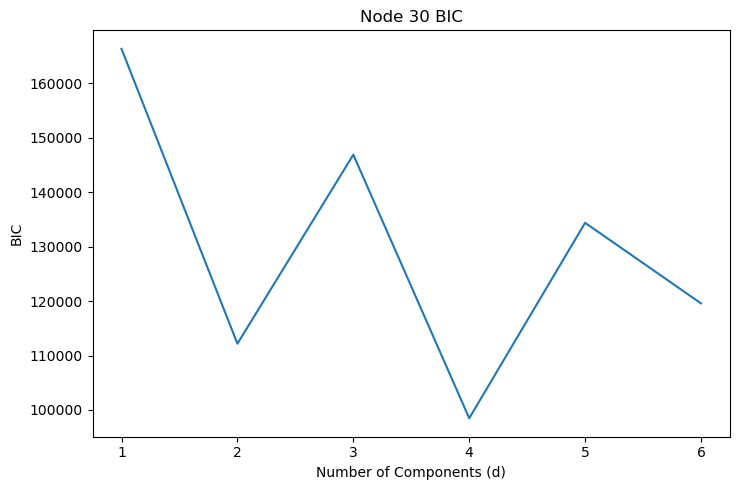

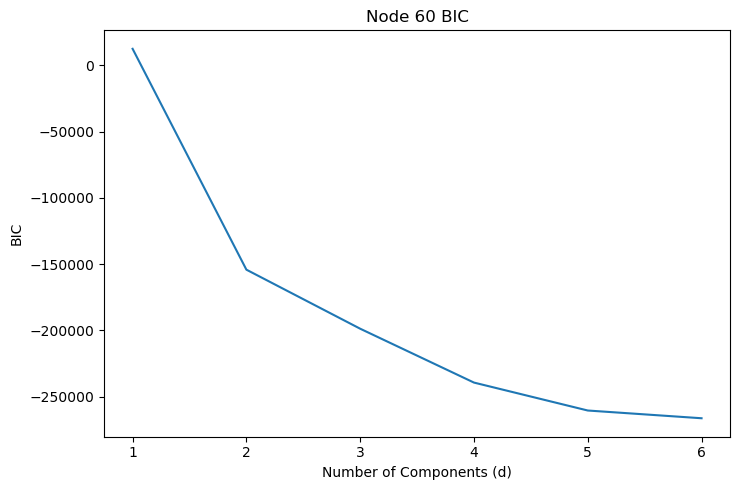

In [46]:
for i, node in enumerate([17, 30, 60]):
    plt.figure(figsize=(7.5, 5))  # Set the figure size
    plt.plot(k_arr, BIC_by_node[i])  # Plot BIC values for the current node
    plt.title(f'Node {node} BIC')  # Set the title
    plt.xlabel('Number of Components (d)')  # Set x-axis label
    plt.ylabel('BIC')  # Set y-axis label
    plt.tight_layout()  # Adjust layout
    plt.show()  # Show the plot

In [50]:
from sklearn.mixture import GaussianMixture

# Assuming you have already defined model_sigmoid and imported necessary libraries

# Define the range of components
k_arr = np.arange(10) + 1

# Initialize an array to store GMM models for each node and each value of k
models_by_node = []

# Iterate over nodes
for node_key in model_sigmoid.node_dict["Layer2"].keys():
    X = np.array(model_sigmoid.node_dict["Layer2"][node_key]).reshape(-1, 1)
    
    # Initialize an array to store GMM models for this node
    models_for_node = []
    
    # Fit GMMs for different values of k
    for k in k_arr:
        gmm = GaussianMixture(n_components=k).fit(X)
        models_for_node.append(gmm)
    
    # Append the models for this node to the overall list
    models_by_node.append(models_for_node)

# # Plotting
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for models_for_node, ax_row in zip(models_by_node, axes):
#     for gmm, ax in zip(models_for_node, ax_row):
#         plot_mixture(gmm, X, show_legend=False, ax=ax)
#         ax.set_title(f'k={gmm.n_components}')
# plt.tight_layout()

# Compute AIC and BIC for each model
AIC_by_node = []
BIC_by_node = []
for models_for_node in models_by_node:
    AIC_for_node = [m.aic(X) for m in models_for_node]
    BIC_for_node = [m.bic(X) for m in models_for_node]
    AIC_by_node.append(AIC_for_node)
    BIC_by_node.append(BIC_for_node)
    
# Find the best models based on AIC
best_models_by_node = [models[np.argmin(AIC_node)] for models, AIC_node in zip(models_by_node, AIC_by_node)]

# # Plot AIC and BIC
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for AIC_node, BIC_node, ax_row in zip(AIC_by_node, BIC_by_node, axes):
#     ax_row[0].plot(k_arr, AIC_node, label='AIC')
#     ax_row[1].plot(k_arr, BIC_node, label='BIC')
#     for ax in ax_row:
#         ax.set_xlabel('Number of Components ($k$)')
#         ax.legend()
# plt.tight_layout()



# # Plot the best models
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for best_model, ax_row in zip(best_models_by_node, axes):
#     plot_mixture(best_model, X, ax=ax_row[0])
#     ax_row[0].set_title(f'Best Model (k={best_model.n_components})')
# plt.tight_layout()


## AIC

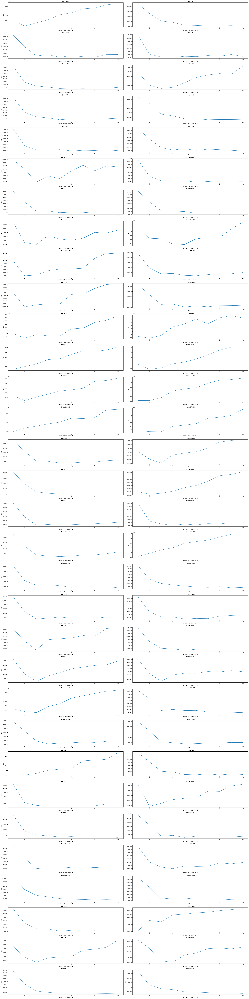

In [51]:
fig, axs = plt.subplots(32, 2, figsize=(30, 120)) 

for i, ax in enumerate(axs.flat):
    ax.plot(k_arr, AIC_by_node[i])
    ax.set_title(f'Node {i} AIC')
    ax.set_xlabel('Number of Components (k)')  # Set x-axis label
    ax.set_ylabel('AIC')  # Set y-axis label
        
plt.tight_layout()

## BIC

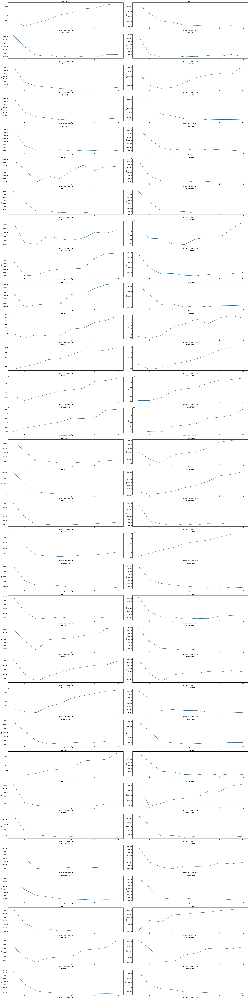

In [52]:
fig, axs = plt.subplots(32, 2, figsize=(30, 120)) 

for i, ax in enumerate(axs.flat):
    ax.plot(k_arr, BIC_by_node[i])
    ax.set_title(f'Node {i} BIC')
    ax.set_xlabel('Number of Components (k)')  # Set x-axis label
    ax.set_ylabel('BIC')  # Set y-axis label
        
plt.tight_layout()

We check if the k that minimizes the AIC is the same as the one minimizing BIC

In [53]:
T = 0
F = 0
for i in range(len(AIC_by_node)):
    if np.argmin(AIC_by_node[i]) == np.argmin(BIC_by_node[i]):
        T+=1
    else:
        F+=1
print("AIC = BIC", T)
print("AIC != BIC", F)
    

AIC = BIC 63
AIC != BIC 1


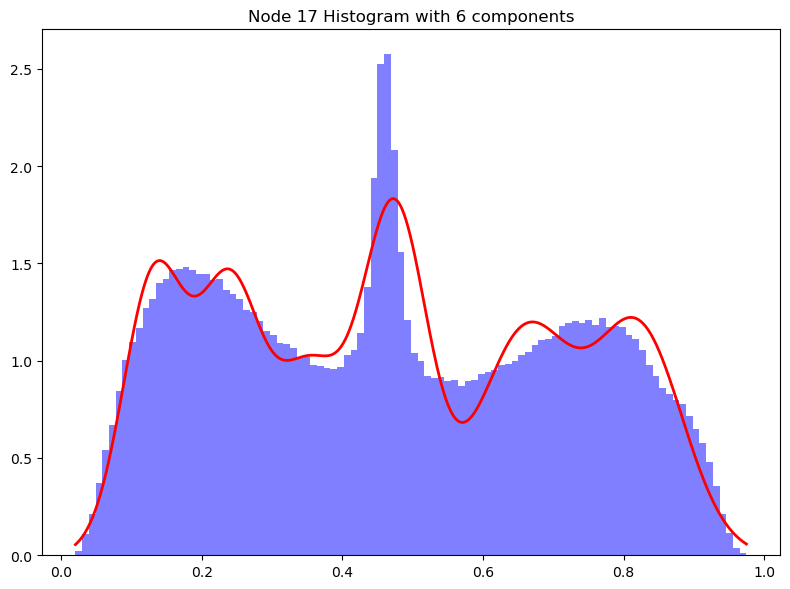

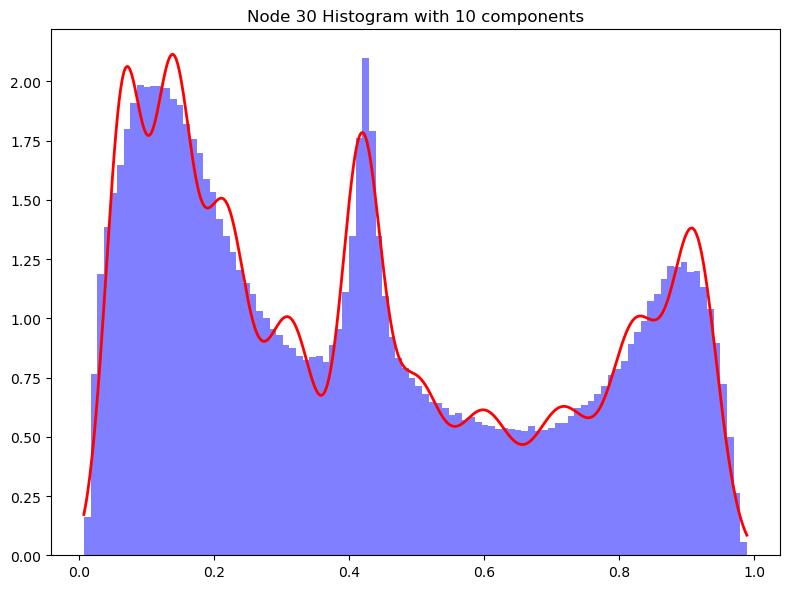

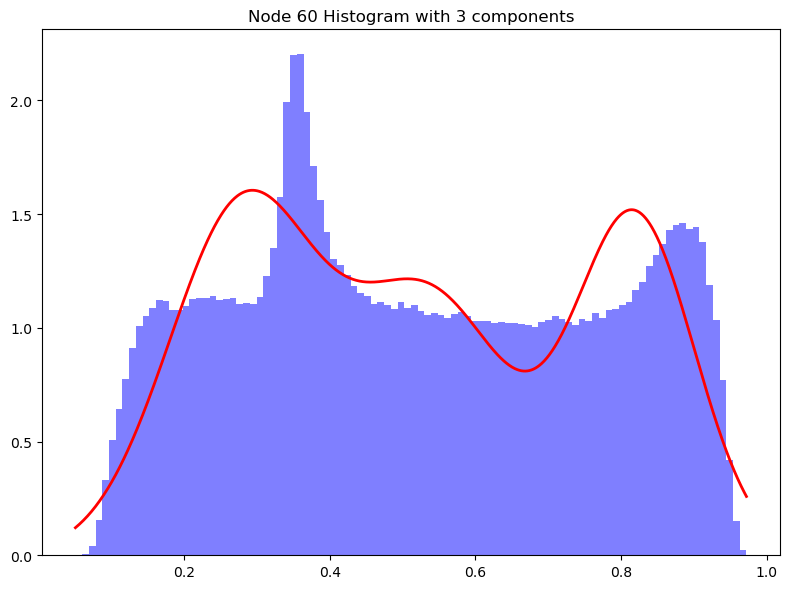

In [54]:
l = [17, 30, 60]

for i in l:
    node_data = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"])
    best_model = best_models_by_node[i]

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.hist(node_data, bins=100, density=True, alpha=0.5, color='b')
    x = np.linspace(node_data.min(), node_data.max(), 1000)
    ax.plot(x, np.exp(best_model.score_samples(x.reshape(-1, 1))), color='red', linewidth=2)
    ax.set_title(f'Node {i} Histogram with {best_model.n_components} components')

    plt.tight_layout()
    plt.show()

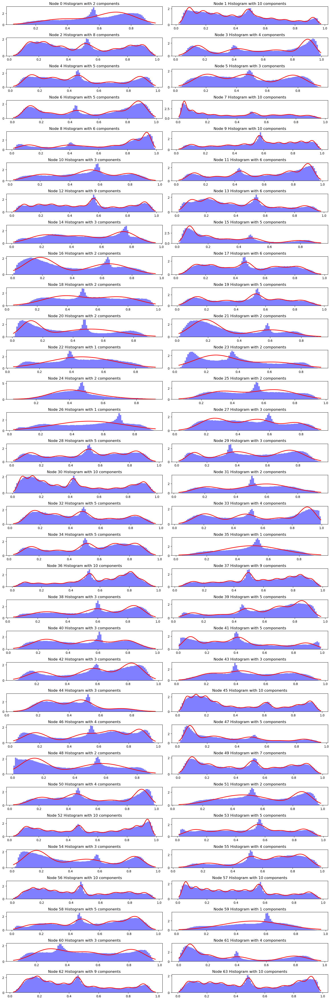

In [55]:
# Plotting
fig, axes = plt.subplots(32, 2, figsize=(15, 45), dpi=100)
axes = axes.flatten()  
for i, (models_for_node, ax) in enumerate(zip(models_by_node, axes)):
    node_data = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"])
    ax.hist(node_data, bins=100, density=True, alpha=0.5, color='b')
    best_model = best_models_by_node[i]
    x = np.linspace(node_data.min(), node_data.max(), 1000)
    ax.plot(x, np.exp(best_model.score_samples(x.reshape(-1, 1))), color='red', linewidth=2)
    ax.set_title(f'Node {i} Histogram with {best_model.n_components} components')

plt.tight_layout()
plt.show()

l = [16, 30, 60]


We now extract the normal distributions' parameters to create confidence intervals

We construct confidence intervals based on the formula

$$
\mu \pm k*\sigma
$$ 
where $k$ is a constant



In [56]:

node_num = 0
k = 1
print("Node number =", node_num)
print('\n')
num_components = best_models_by_node[node_num].n_components
print("Number of components", num_components)
print('\n')
means = best_models_by_node[node_num].means_
print("means", best_models_by_node[node_num].means_)
print('\n')
print("variances", best_models_by_node[node_num].covariances_)
print("\n")
sd = np.sqrt(best_models_by_node[node_num].covariances_)
print("standard deviations", sd )
ranges = [[(means[i]-k*sd[i]).item(),(means[i]+k*sd[i]).item()] for i in range(num_components)]
print("\n")
print("k =",k)
print("ranges = mean +- k*sd \n", ranges)

Node number = 0


Number of components 2


means [[0.37125936]
 [0.71209853]]


variances [[[0.02066131]]

 [[0.01424695]]]


standard deviations [[[0.14374043]]

 [[0.11936061]]]


k = 1
ranges = mean +- k*sd 
 [[0.22751893515452012, 0.5149997885947675], [0.5927379204507662, 0.8314591375627388]]


In [57]:
def extract_ranges_gmm(models, n_std=1):
        node_dict = {"Layer2":None}
        node_dict["Layer2"] = {f"node{i}": [] for i in range(64)}
        for node_num in range(len(models)):
            num_components = models[node_num].n_components
            means = models[node_num].means_
            sd = np.sqrt(models[node_num].covariances_)
            ranges = [[(means[i]-n_std*sd[i]).item(),(means[i]+n_std*sd[i]).item()] for i in range(num_components)]
            node_dict["Layer2"][f"node{node_num}"] = ranges
        return node_dict
        
node_dict_gmm = extract_ranges_gmm(best_models_by_node, n_std = 1)


In [58]:
def evaluate_model_gmm(neuralnet, gmm_models, valloader, n_std = 2):
    device='cuda'
    k=0
    model = neuralnet
    hidden_sizes = model.hidden_sizes
    value_ranges = extract_ranges_gmm(gmm_models, n_std= n_std)
    model.eval()
    model.testing = True
    model.reset_testing_dict()
    node_count = np.sum([len(subdict) for subdict in model.node_dict_testing.values()])

    correct_count, all_count = 0, 0
    percent_list = []
    prediction_list = []
    probab_list = []
    

    for images, labels in valloader:
        images, labels = images.to(device), labels.to(device)

        for index_to_test in range(images.shape[0]):
            img = images[index_to_test].view(1, -1)

            with torch.no_grad():
                logps = model(img)

                true_count = 0
                subdict = model_sigmoid.node_dict_testing.get("Layer2", {})
                for node, values in subdict.items():
                    for rang in value_ranges["Layer2"][node]:
                        if k <5:
                            print("rang", rang, "value", values[all_count])
                            k+=1
                        min_value, max_value = rang
                        if min_value <= values[all_count] <= max_value:
                            true_count += 1

                all_count += 1
                percent_true = true_count / node_count * 100
                percent_list.append(percent_true)
                true_count = 0

                ps = torch.exp(logps)
                probab = list(ps.detach().cpu().numpy()[0])
                pred_label = probab.index(max(probab))
                probab_list.append(max(probab))
                true_label = labels[index_to_test].detach().cpu().numpy()

                if true_label == pred_label:
                    prediction_list.append(True)
                    correct_count += 1
                else:
                    prediction_list.append(False)

    accuracy = correct_count / all_count if all_count > 0 else 0.0
    return accuracy, percent_list, prediction_list, probab_list



In [59]:
for i,k in enumerate(k_list):
    print(f"k =  {k} has correlation {correlation_list[i][0]} and pvalue {correlation_list[i][1]}")

k =  17 has correlation -0.05303802927240181 and pvalue 0.1771717939331
k =  30 has correlation -0.42921014021725473 and pvalue 0.0
k =  60 has correlation -0.045146615551075325 and pvalue 0.25076216719347394


rang [0.299389148514582, 0.44312957523470564] value 0.8457287
rang [0.6524182247287593, 0.7717788332847457] value 0.8457287
rang [0.6256196202808013, 0.6598082723460357] value 0.0871743
rang [0.16156998234986783, 0.1982894232708741] value 0.0871743
rang [0.35956973459361735, 0.39879716566183304] value 0.0871743
Model Accuracy = 93.51%


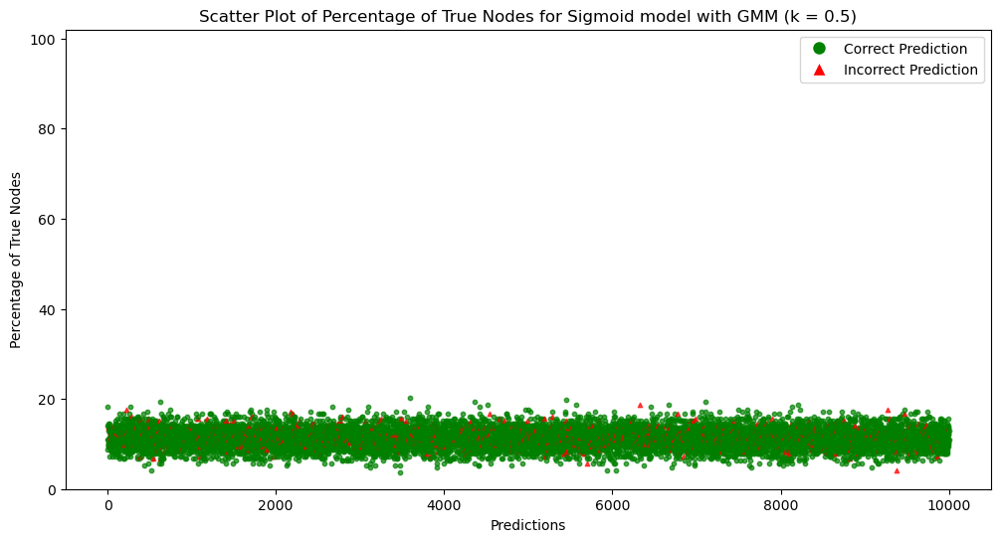

rang [0.22751893515452012, 0.5149997885947675] value 0.77456445
rang [0.5927379204507662, 0.8314591375627388] value 0.77456445
rang [0.6085252942481842, 0.6769025983786527] value 0.028529635
rang [0.1432102618893647, 0.21664914373137723] value 0.028529635
rang [0.3399560190595095, 0.4184108811959409] value 0.028529635
Model Accuracy = 93.51%


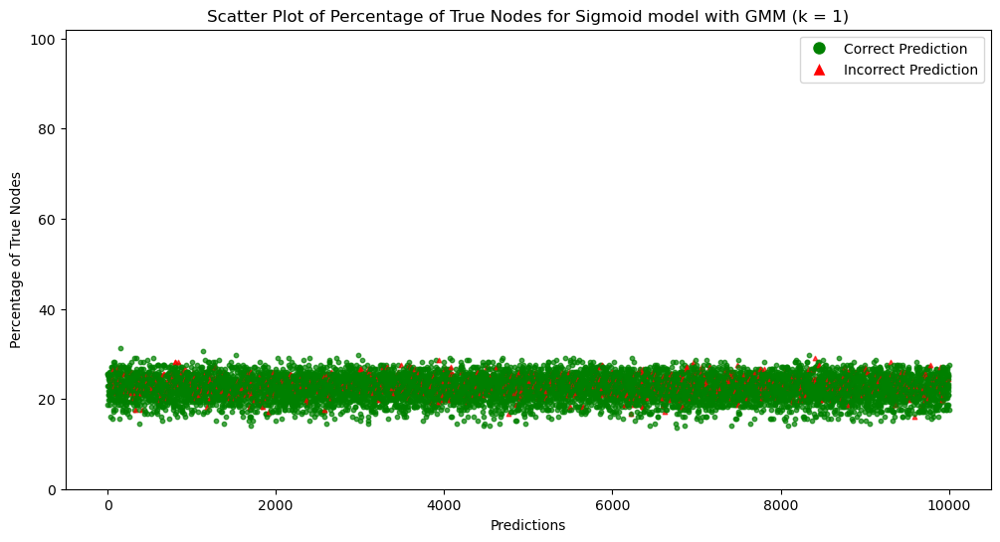

rang [0.15564872179445827, 0.5868700019548294] value 0.322486
rang [0.533057616172773, 0.891139441840732] value 0.322486
rang [0.5914309682155671, 0.6939969244112699] value 0.79787797
rang [0.12485054142886155, 0.23500886419188038] value 0.79787797
rang [0.32034230352540166, 0.43802459673004873] value 0.79787797
Model Accuracy = 93.51%


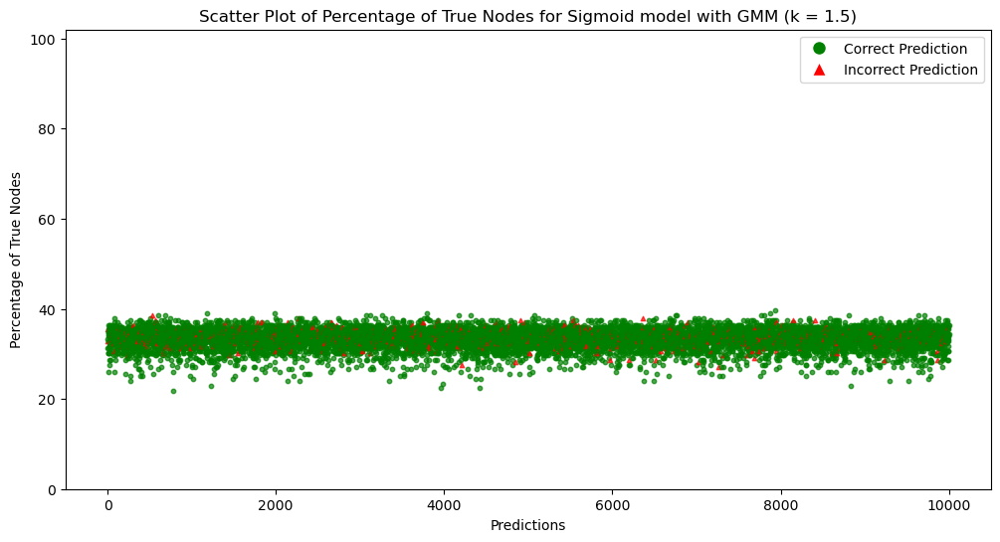

rang [0.08377850843439644, 0.6587402153148911] value 0.68137854
rang [0.4733773118947799, 0.9508197461187251] value 0.68137854
rang [0.57433664218295, 0.711091250443887] value 0.9119762
rang [0.10649082096835842, 0.2533685846523835] value 0.9119762
rang [0.3007285879912938, 0.4576383122641566] value 0.9119762
Model Accuracy = 93.51%


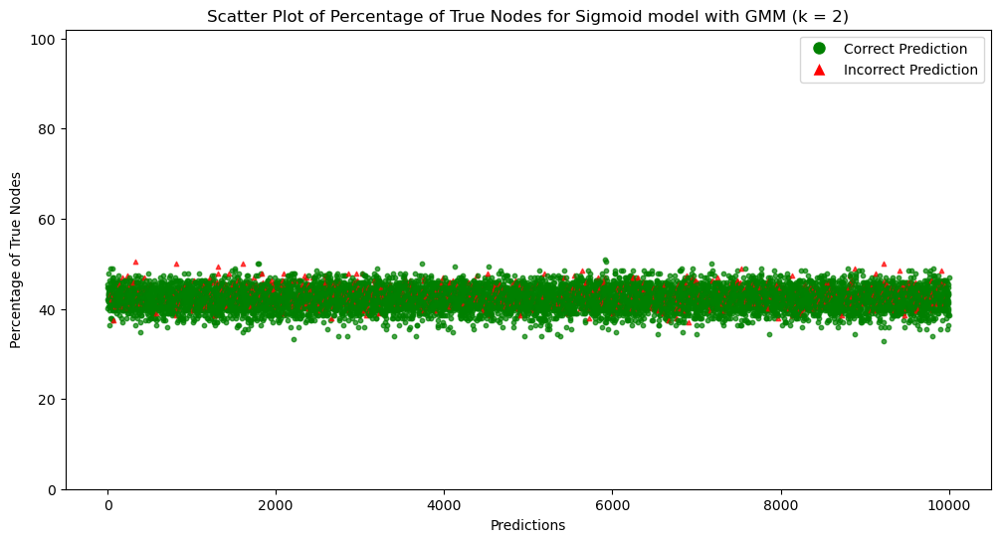

rang [0.011908295074334607, 0.7306104286749531] value 0.739612
rang [0.41369700761678674, 1.0105000503967183] value 0.739612
rang [0.5572423161503328, 0.7281855764765042] value 0.842917
rang [0.08813110050785529, 0.27172830511288665] value 0.842917
rang [0.28111487245718597, 0.4772520277982644] value 0.842917
Model Accuracy = 93.51%


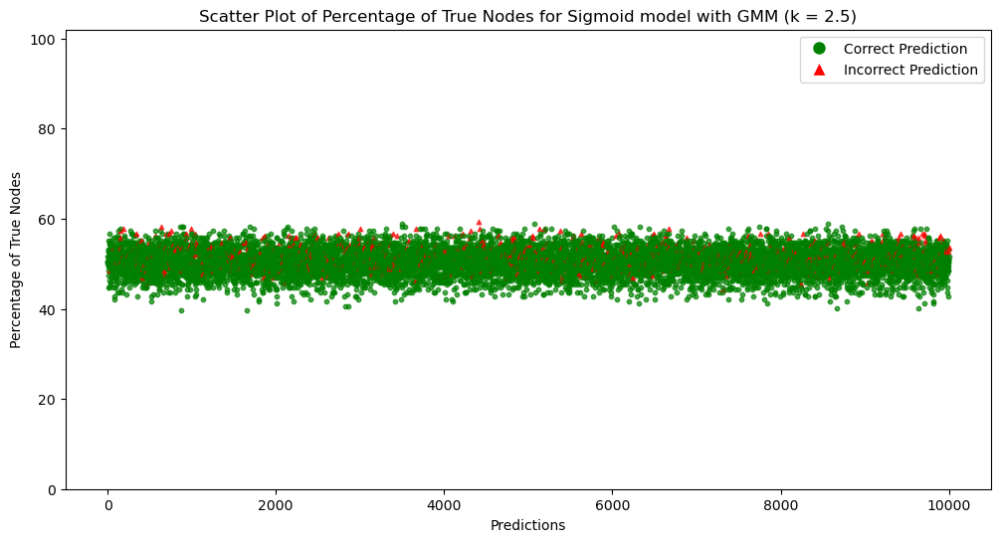

rang [-0.05996191828572728, 0.8024806420350149] value 0.6349406
rang [0.35401670333879354, 1.0701803546747115] value 0.6349406
rang [0.5401479901177157, 0.7452799025091212] value 0.22538278
rang [0.06977138004735214, 0.29008802557338975] value 0.22538278
rang [0.26150115692307807, 0.4968657433323723] value 0.22538278
Model Accuracy = 93.51%


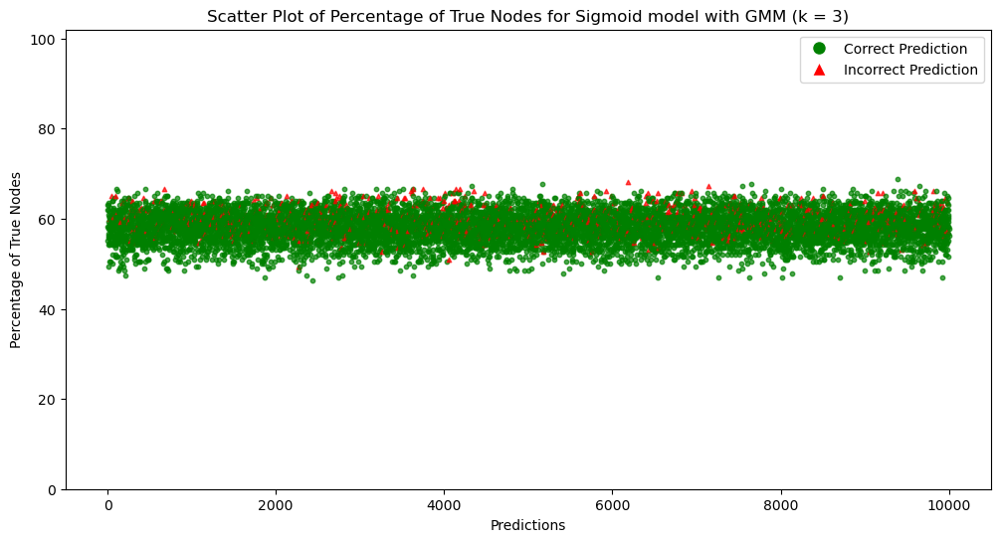

k =  0.5 has correlation -0.05312601056714005 and pvalue 1.0625345555215158e-07
k =  1 has correlation -0.06395673508650705 and pvalue 1.5393031080331887e-10
k =  1.5 has correlation -0.052845843363927496 and pvalue 1.2391913212448456e-07
k =  2 has correlation -0.10138417323046721 and pvalue 2.8898650712495604e-24
k =  2.5 has correlation -0.135684188947654 and pvalue 2.663263111224229e-42
k =  3 has correlation -0.1562139494165443 and pvalue 1.1748800033906529e-55


In [60]:
correlation_list = []
k_list = [0.5,1,1.5,2,2.5,3]
for k in k_list:
    accuracy_sigmoid, percent_list_sigmoid, prediction_list_sigmoid, probab_list = evaluate_model_gmm(model_sigmoid,
                                                                                         best_models_by_node,
                                                                                         valloader,
                                                                                         n_std=k)
    print(f"Model Accuracy = {accuracy_sigmoid * 100}%")
    plot_percentage_scatter(percent_list_sigmoid, prediction_list_sigmoid, num_points=None, ymin=0, ymax=102,
                           title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM (k = {k})")
    r_pb, p_value = pointbiserialr(prediction_list_sigmoid, percent_list_sigmoid)
    correlation_list.append((r_pb, p_value))

for i,k in enumerate(k_list):
    print(f"k =  {k} has correlation {correlation_list[i][0]} and pvalue {correlation_list[i][1]}")

 #### We now try the same but just for $k$=10


In [61]:
from sklearn.mixture import GaussianMixture

# Assuming you have already defined model_sigmoid and imported necessary libraries

# Define the range of components
k_arr = np.array([10])

# Initialize an array to store GMM models for each node and each value of k
models_by_node = []

# Iterate over nodes
for node_key in model_sigmoid.node_dict["Layer2"].keys():
    X = np.array(model_sigmoid.node_dict["Layer2"][node_key]).reshape(-1, 1)
    
    # Initialize an array to store GMM models for this node
    models_for_node = []
    
    # Fit GMMs for different values of k
    for k in k_arr:
        gmm = GaussianMixture(n_components=k).fit(X)
        models_for_node.append(gmm)
    
    # Append the models for this node to the overall list
    models_by_node.append(models_for_node)

# # Plotting
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for models_for_node, ax_row in zip(models_by_node, axes):
#     for gmm, ax in zip(models_for_node, ax_row):
#         plot_mixture(gmm, X, show_legend=False, ax=ax)
#         ax.set_title(f'k={gmm.n_components}')
# plt.tight_layout()

# Compute AIC and BIC for each model
AIC_by_node = []
BIC_by_node = []
for models_for_node in models_by_node:
    AIC_for_node = [m.aic(X) for m in models_for_node]
    BIC_for_node = [m.bic(X) for m in models_for_node]
    AIC_by_node.append(AIC_for_node)
    BIC_by_node.append(BIC_for_node)
    
# Find the best models based on AIC
best_models_by_node = [models[np.argmin(AIC_node)] for models, AIC_node in zip(models_by_node, AIC_by_node)]

# # Plot AIC and BIC
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for AIC_node, BIC_node, ax_row in zip(AIC_by_node, BIC_by_node, axes):
#     ax_row[0].plot(k_arr, AIC_node, label='AIC')
#     ax_row[1].plot(k_arr, BIC_node, label='BIC')
#     for ax in ax_row:
#         ax.set_xlabel('Number of Components ($k$)')
#         ax.legend()
# plt.tight_layout()



# # Plot the best models
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for best_model, ax_row in zip(best_models_by_node, axes):
#     plot_mixture(best_model, X, ax=ax_row[0])
#     ax_row[0].set_title(f'Best Model (k={best_model.n_components})')
# plt.tight_layout()





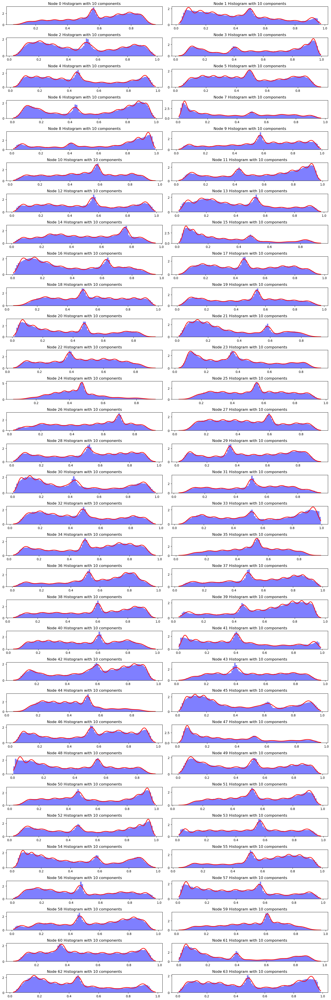

In [62]:
fig, axes = plt.subplots(32, 2, figsize=(15, 45), dpi=100)
axes = axes.flatten()  
for i, (models_for_node, ax) in enumerate(zip(models_by_node, axes)):
    node_data = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"])
    ax.hist(node_data, bins=100, density=True, alpha=0.5, color='b')
    best_model = best_models_by_node[i]
    x = np.linspace(node_data.min(), node_data.max(), 1000)
    ax.plot(x, np.exp(best_model.score_samples(x.reshape(-1, 1))), color='red', linewidth=2)
    ax.set_title(f'Node {i} Histogram with {best_model.n_components} components')

plt.tight_layout()
plt.show()

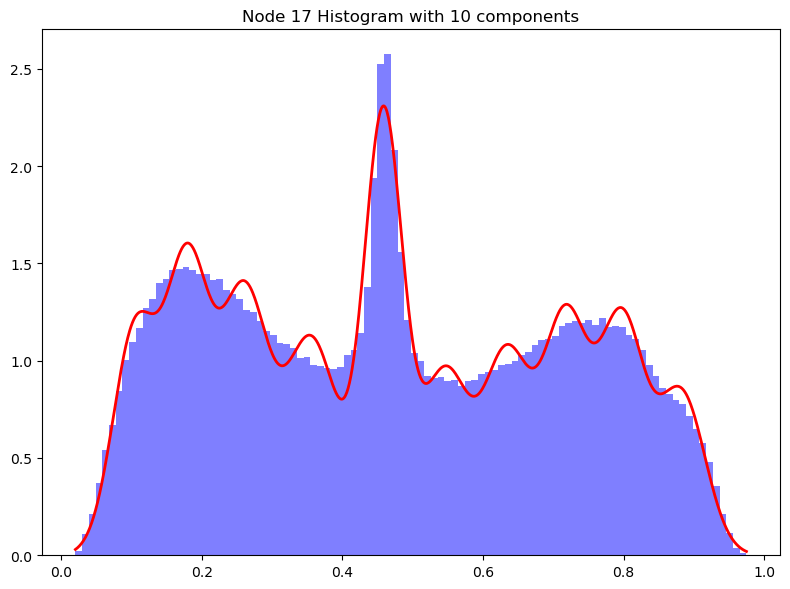

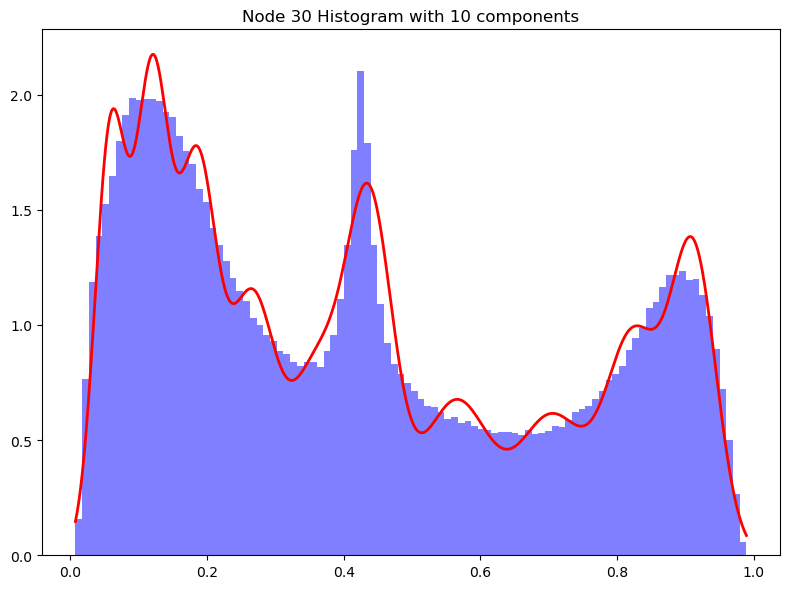

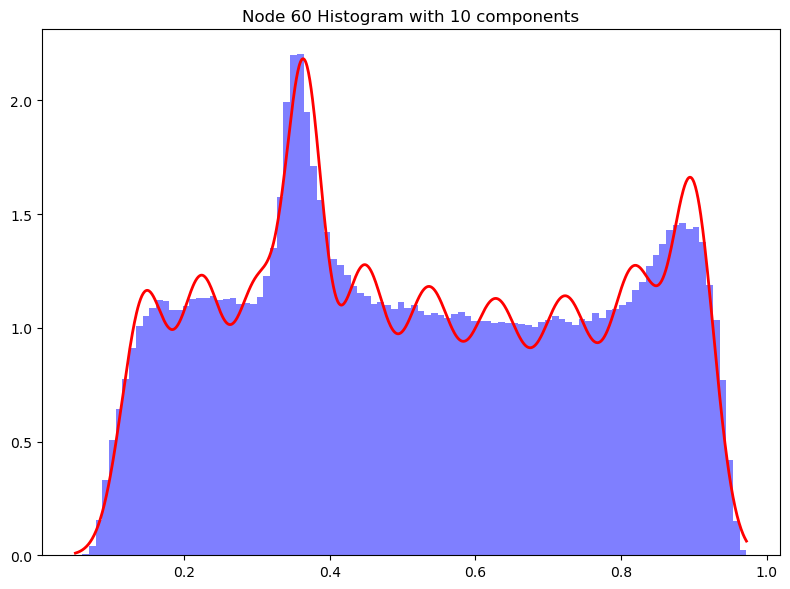

In [63]:
l = [17, 30, 60]

for i in l:
    node_data = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"])
    best_model = best_models_by_node[i]

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.hist(node_data, bins=100, density=True, alpha=0.5, color='b')
    x = np.linspace(node_data.min(), node_data.max(), 1000)
    ax.plot(x, np.exp(best_model.score_samples(x.reshape(-1, 1))), color='red', linewidth=2)
    ax.set_title(f'Node {i} Histogram with {best_model.n_components} components')

    plt.tight_layout()
    plt.show()

rang [0.7733956712486304, 0.8023724974690948] value 0.6721893
rang [0.30331929442536654, 0.33556230962464384] value 0.6721893
rang [0.62574701643162, 0.6548816865256021] value 0.6721893
rang [0.4733794873598467, 0.5036894741182238] value 0.6721893
rang [0.13942204345646975, 0.17375763502334363] value 0.6721893
Model Accuracy = 93.51%


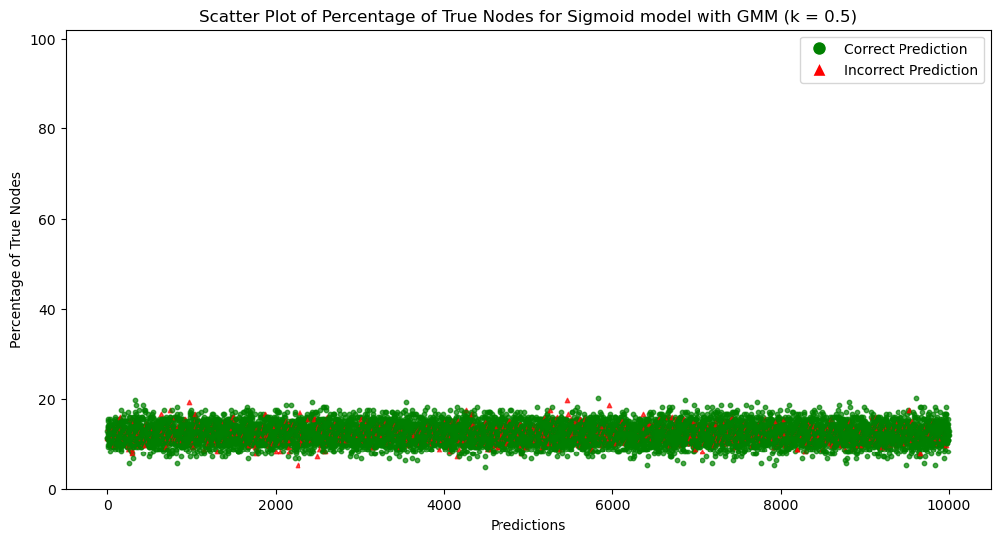

rang [0.7589072581383981, 0.8168609105793271] value 0.6508714
rang [0.28719778682572794, 0.35168381722428244] value 0.6508714
rang [0.611179681384629, 0.6694490215725931] value 0.6508714
rang [0.4582244939806581, 0.5188444674974124] value 0.6508714
rang [0.12225424767303283, 0.19092543080678054] value 0.6508714
Model Accuracy = 93.51%


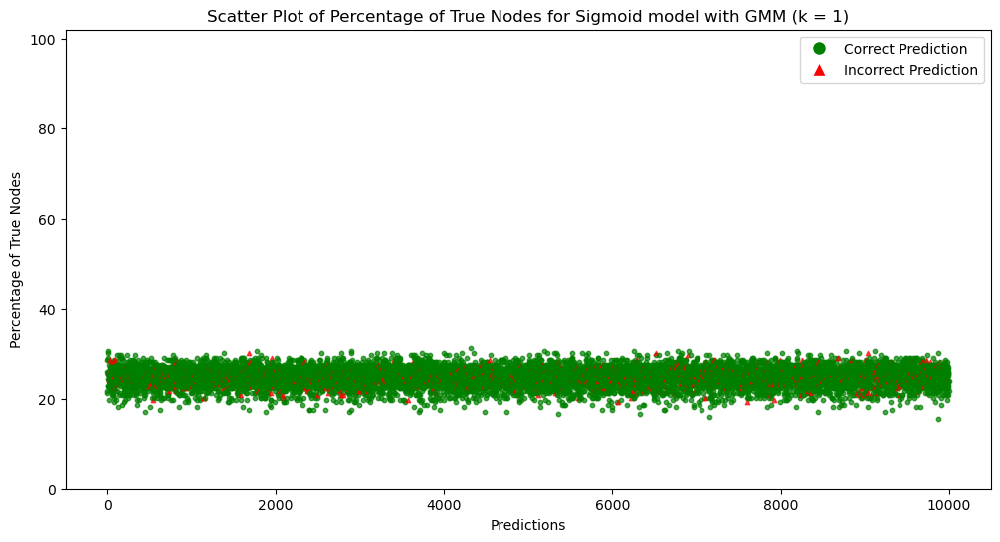

rang [0.7444188450281659, 0.8313493236895593] value 0.109939694
rang [0.2710762792260893, 0.3678053248239211] value 0.109939694
rang [0.5966123463376378, 0.6840163566195843] value 0.109939694
rang [0.44306950060146955, 0.533999460876601] value 0.109939694
rang [0.1050864518895959, 0.20809322659021748] value 0.109939694
Model Accuracy = 93.51%


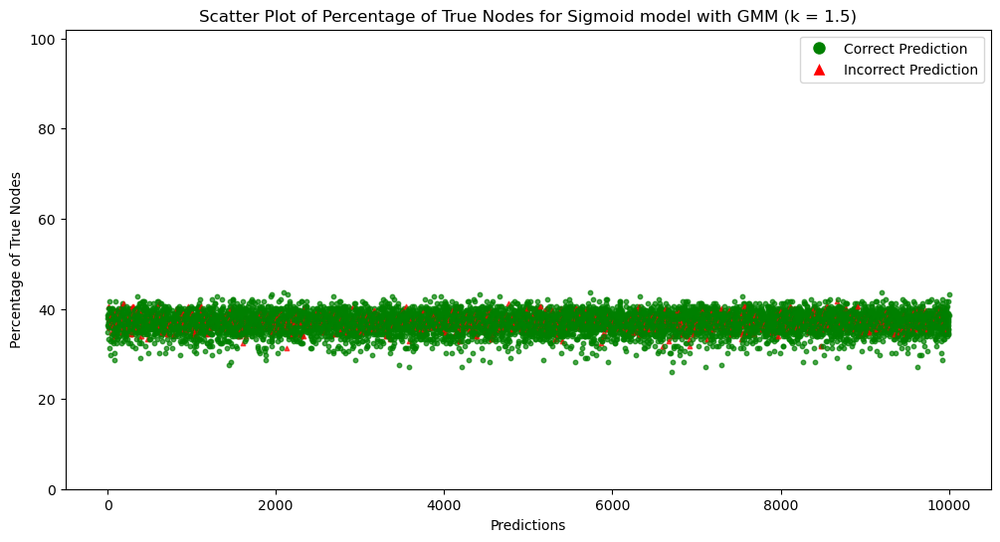

rang [0.7299304319179336, 0.8458377367997916] value 0.7665353
rang [0.25495477162645064, 0.38392683242355974] value 0.7665353
rang [0.5820450112906468, 0.6985836916665753] value 0.7665353
rang [0.42791450722228097, 0.5491544542557896] value 0.7665353
rang [0.08791865610615897, 0.22526102237365442] value 0.7665353
Model Accuracy = 93.51%


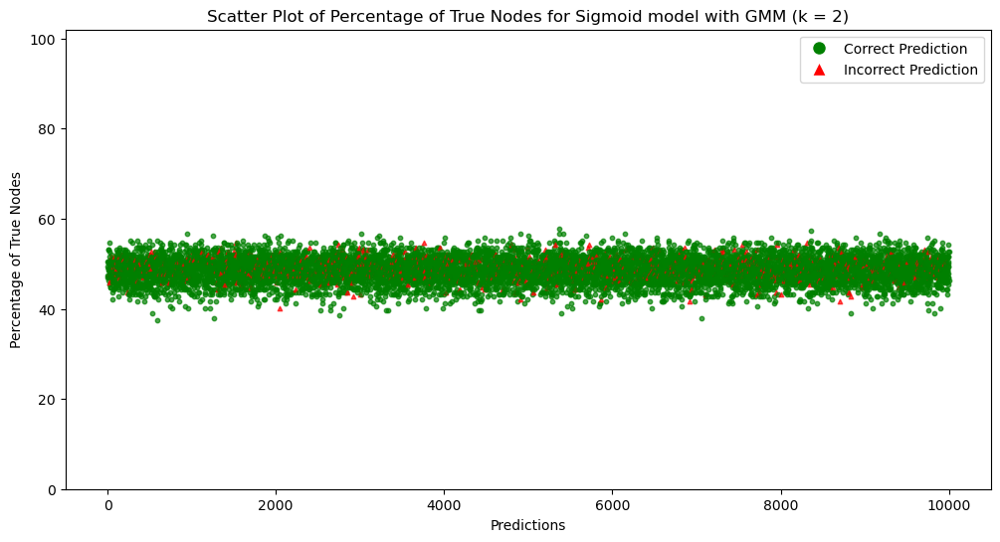

rang [0.7154420188077014, 0.8603261499100238] value 0.82871795
rang [0.238833264026812, 0.4000483400231984] value 0.82871795
rang [0.5674776762436557, 0.7131510267135663] value 0.82871795
rang [0.4127595138430924, 0.5643094476349781] value 0.82871795
rang [0.07075086032272204, 0.24242881815709133] value 0.82871795
Model Accuracy = 93.51%


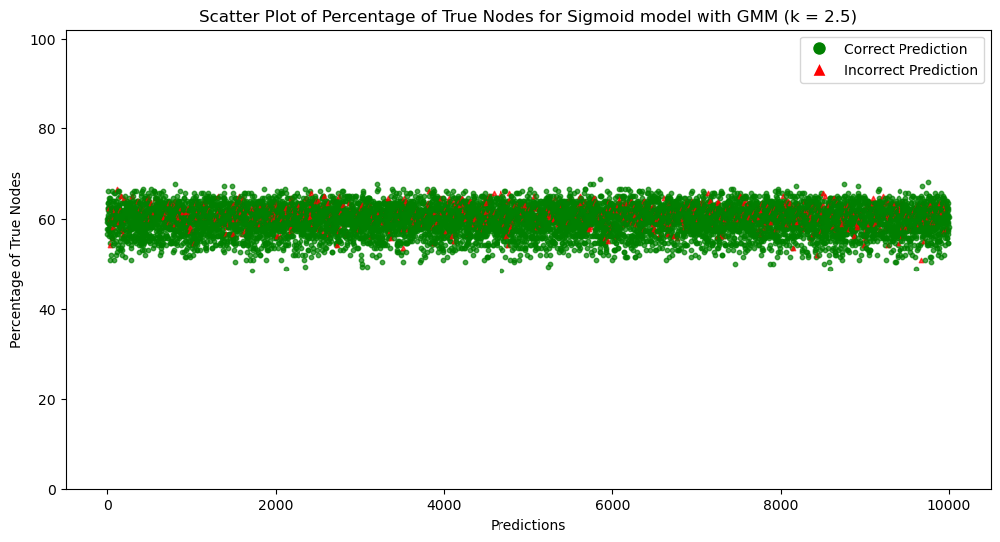

rang [0.7009536056974691, 0.8748145630202561] value 0.29793414
rang [0.22271175642717336, 0.41616984762283704] value 0.29793414
rang [0.5529103411966647, 0.7277183617605574] value 0.29793414
rang [0.3976045204639038, 0.5794644410141667] value 0.29793414
rang [0.0535830645392851, 0.25959661394052824] value 0.29793414
Model Accuracy = 93.51%


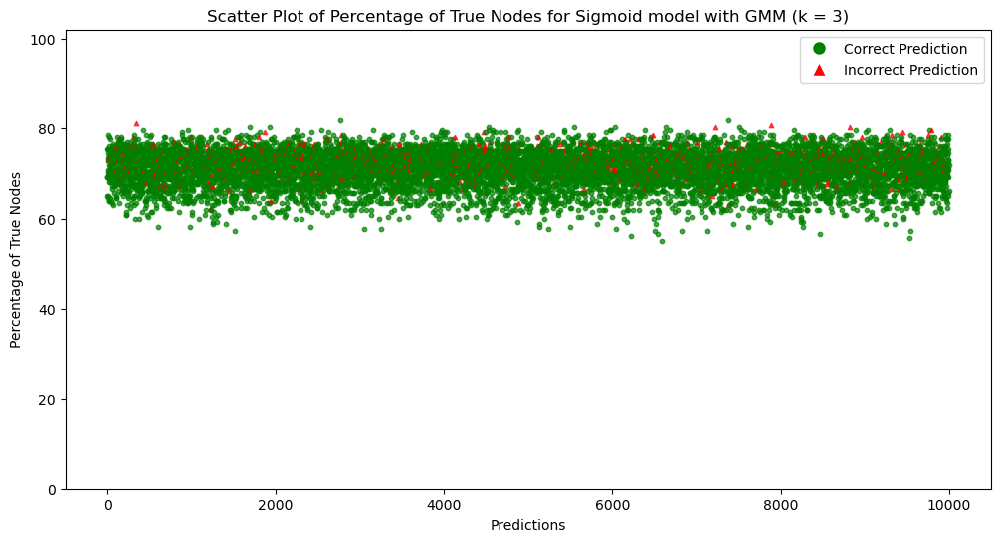

k =  0.5 has correlation -0.002927589880912649 and pvalue 0.7697338741001307
k =  1 has correlation -0.0030210226646977677 and pvalue 0.7626023674673361
k =  1.5 has correlation -0.0130044384009051 and pvalue 0.19348574721205636
k =  2 has correlation -0.05158718029601516 and pvalue 2.449659972385221e-07
k =  2.5 has correlation -0.09145610873102898 and pvalue 5.0158680730566165e-20
k =  3 has correlation -0.10779403848170699 and pvalue 3.1013966189955055e-27


In [64]:
correlation_list = []
k_list = [0.5,1,1.5,2,2.5,3]
for k in k_list:
    accuracy_sigmoid, percent_list_sigmoid, prediction_list_sigmoid, probab_list = evaluate_model_gmm(model_sigmoid,
                                                                                         best_models_by_node,
                                                                                         valloader,
                                                                                         n_std=k)
    print(f"Model Accuracy = {accuracy_sigmoid * 100}%")
    plot_percentage_scatter(percent_list_sigmoid, prediction_list_sigmoid, num_points=None, ymin=0, ymax=102,
                           title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM (k = {k})")
    r_pb, p_value = pointbiserialr(prediction_list_sigmoid, percent_list_sigmoid)
    correlation_list.append((r_pb, p_value))

for i,k in enumerate(k_list):
    print(f"k =  {k} has correlation {correlation_list[i][0]} and pvalue {correlation_list[i][1]}")

In [65]:
accuracy_sigmoid_gmm, percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, probab_list_sigmoid_gmm = evaluate_model_gmm(model_sigmoid,
                                                                                                                         best_models_by_node,
                                                                                                                         valloader,
                                                                                                                         n_std=1)

rang [0.7589072581383981, 0.8168609105793271] value 0.15818948
rang [0.28719778682572794, 0.35168381722428244] value 0.15818948
rang [0.611179681384629, 0.6694490215725931] value 0.15818948
rang [0.4582244939806581, 0.5188444674974124] value 0.15818948
rang [0.12225424767303283, 0.19092543080678054] value 0.15818948


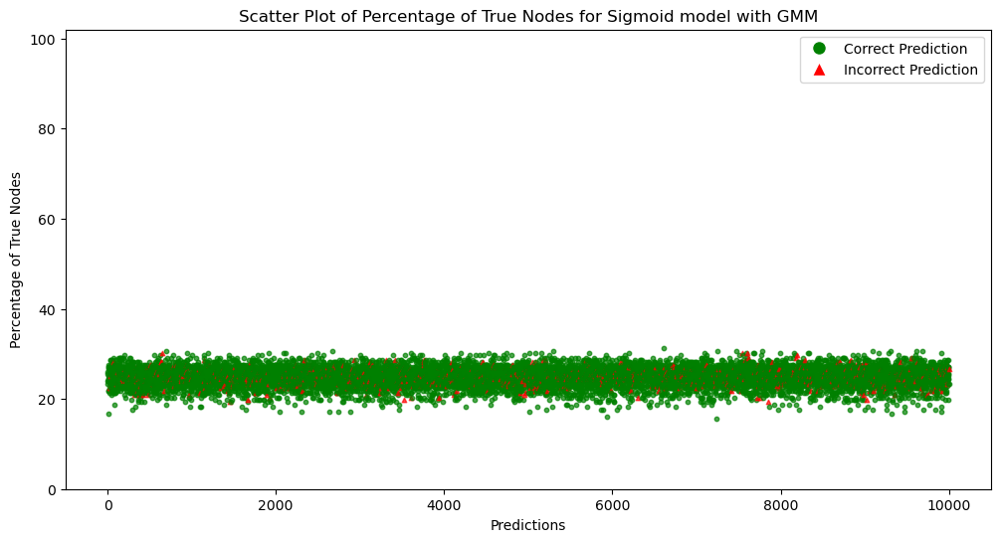

In [66]:
plot_percentage_scatter(percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, num_points=None, ymin=0, ymax=102,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM")

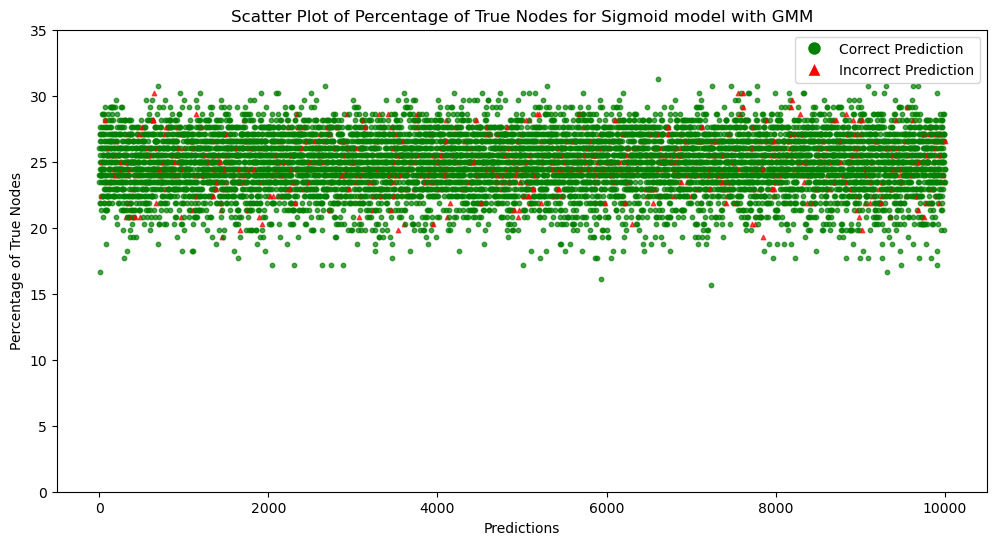

In [67]:
plot_percentage_scatter(percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, num_points=None, ymin=0, ymax=35,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM")

In [68]:
accuracy_sigmoid_gmm, percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, probab_list_sigmoid_gmm = evaluate_model_gmm(model_sigmoid,
                                                                                                                         best_models_by_node,
                                                                                                                         valloader,
                                                                                                                         n_std=2)

rang [0.7299304319179336, 0.8458377367997916] value 0.21070768
rang [0.25495477162645064, 0.38392683242355974] value 0.21070768
rang [0.5820450112906468, 0.6985836916665753] value 0.21070768
rang [0.42791450722228097, 0.5491544542557896] value 0.21070768
rang [0.08791865610615897, 0.22526102237365442] value 0.21070768


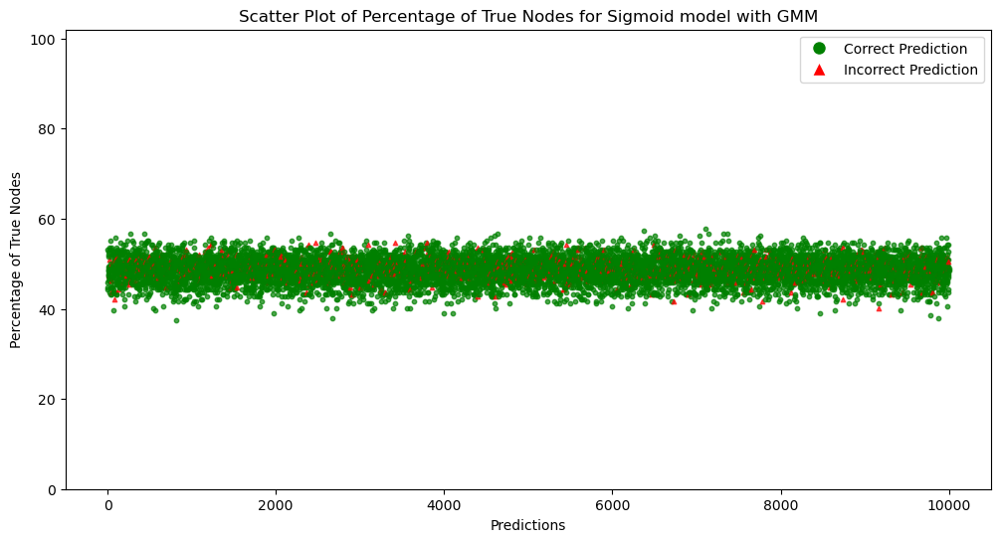

In [69]:
plot_percentage_scatter(percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, num_points=None, ymin=0, ymax=102,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM")

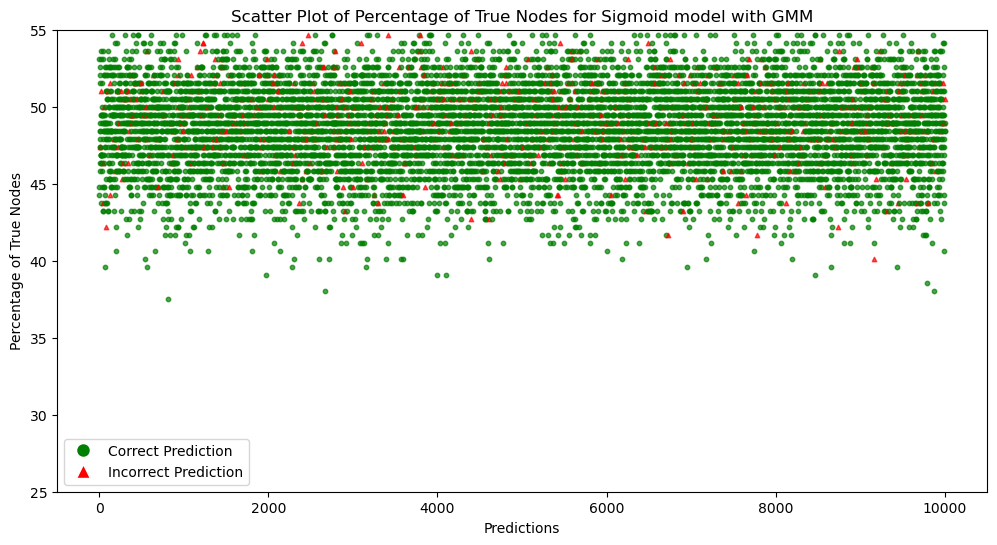

In [70]:
plot_percentage_scatter(percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, num_points=None, ymin=25, ymax=55,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM")

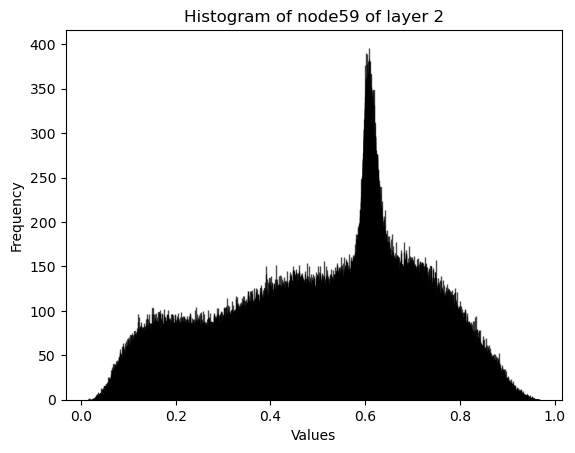

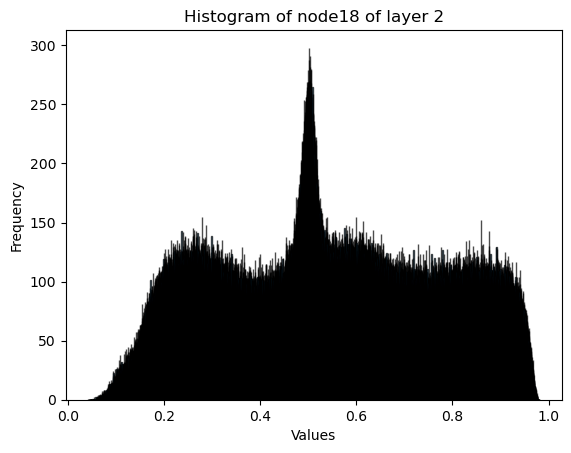

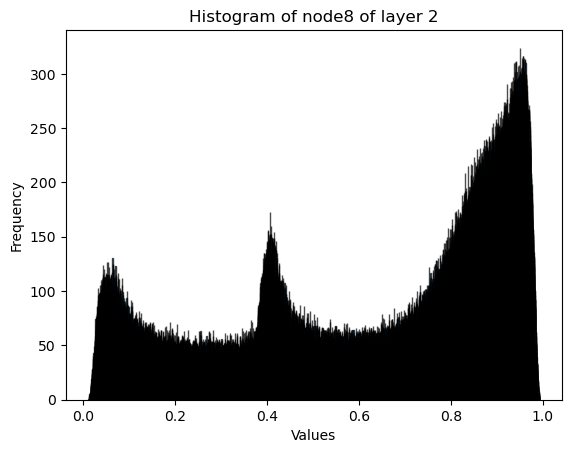

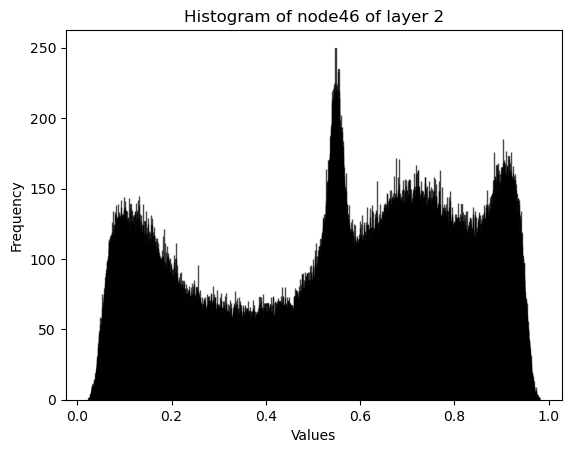

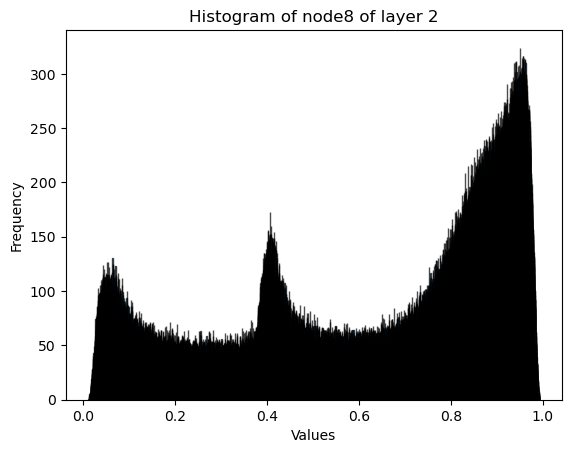

In [71]:
k_list = np.random.randint(0, 64, size=5)

for k in k_list:

        # Determine the range of data
        data_min = min(model_sigmoid.node_dict["Layer2"][f"node{k}"])
        data_max = max(model_sigmoid.node_dict["Layer2"][f"node{k}"])
        step_size = 0.0001

        # Calculate the number of bins needed
        num_bins = int((data_max - data_min) / step_size) + 1

        # Generate bins with adjusted range and step size
        bins = np.linspace(data_min, data_max, num_bins)

        # Plot the histogram
        plt.hist(model_sigmoid.node_dict["Layer2"][f"node{k}"], bins=bins, edgecolor='black', alpha=0.7)

        # Set labels and title for the plot
        plt.xlabel('Values')
        plt.ylabel('Frequency')
        plt.title(f'Histogram of node{k} of layer 2')

        # Show the plot
        plt.show()